In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [3]:
df = pd.read_csv('Airbnb_Open_Data.csv')

C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2167922700.py:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('Airbnb_Open_Data.csv')


In [4]:
# tentang dataset
df.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

![Alt text](image-2.png)

In [5]:
df.head(3)

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

# **Perform Data Standard Cleaning**
## 1. Missing Values

In [7]:
df.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

Kolom license hanya berisi 2 value, sisanya kosong. jadi kita drop saja kolom tersebut

In [8]:
df.drop('license', axis=1, inplace=True)

<50% rule

In [9]:
# persen untuk setiap baris yang datanya ilang
persen = df.isnull().sum()/df.shape[0] * 100

# create a DataFrame to show case the result
persen = pd.DataFrame({"columns": persen.keys(), "%": persen})
persen.reset_index(drop=True, inplace=True)
persen

,columns,%
0,id,0.000000
1,NAME,0.243667
2,host id,0.000000
3,host_identity_verified,0.281679
4,host name,0.395715
5,neighbourhood group,0.028265
6,neighbourhood,0.015595
7,lat,0.007797
8,long,0.007797
9,country,0.518524


Ternyata kehilangan data di antaranya hanyalah sedikit, terkecuali:
1. last review
2. reviews per month
3. house_rules

Selain ketiga kolom tersebut, semuanya bisa didrop saja barisnya yang null

In [10]:
# biar lebih enak diliat
df.describe().style.background_gradient(cmap='Greens')

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,102599.000000,102599.000000,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,29146234.522130,49254111474.328667,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,16257505.607309,28538996644.374878,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1001254.000000,123600518.000000,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,15085814.500000,24583328475.000000,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,29136603.000000,49117739352.000000,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,43201198.000000,73996495817.000000,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,57367417.000000,98763129024.000000,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


Beberapa hal ganjil yang akan dilakukan outlier handling:
1. minimum_nights dari -1223 s/d 5654????
2. availability 365 (days booked) dari -10 s/d 3677

In [11]:
# Karena namanya juga masih ada spasi, yang gabakal bisa diolah 
# ubah jadi _

columns = ['NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules']

df.columns = [col.lower().replace(" ","_") for col in df.columns]
df.head(3)

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$966,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$142,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$620,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and..."


## **Tinjau satu per satu kolom**

**id**

In [12]:
# Kolom id dan host_id sama keunikannya
# Simpan salah satu saja

df["id"].unique().shape[0]/df["id"].shape[0] * 100

99.47270441232371

**name**

In [13]:
uniq = df["name"].unique().shape[0]/df["name"].shape[0] * 100
lost = df["name"].isnull().sum()/df["name"].shape[0] * 100

print(uniq, lost)

59.729626994415156 0.24366709227185449


In [14]:
# memiliki 59% value unique dan missing value hanya 0.24
# karena kolom ini tidak akan terllau berguna untuk ML
# yang NaN diganti none saja

df["name"].value_counts()

Home away from home                               33
Hillside Hotel                                    30
Water View King Bed Hotel Room                    30
New york Multi-unit building                      27
Brooklyn Apartment                                27
                                                  ..
♂ ♀ Sunny Bedroom in Popular Brooklyn              1
♂ ♀ Large Room Close to Express Subway + Bus       1
Clean room in Soho/Nolita                          1
♂ ♀ Large Sunny Bedroom Walk to Express Subway     1
Parisian Style Apartment in Heart of Brooklyn      1
Name: name, Length: 61281, dtype: int64

In [15]:
df["name"] = df["name"].fillna("none")

In [16]:
# sudah tidak ada yang NaN

df["name"].isnull().sum()/df["name"].shape[0] * 100

0.0

**host_id**

In [17]:
# Kolom host_id hampir 100% unik, maka tidak akan terlalu membantu
# Lebih baik didrop saja untuk mengurangi komputasi

df["host_id"].unique().shape[0]/df["host_id"].shape[0] * 100

99.47172974395461

In [18]:
df.drop(columns = ["host_id"], inplace = True)

**host_identity_verified**

In [19]:
uniq = df["host_identity_verified"].unique().shape[0]/df["host_identity_verified"].shape[0] * 100
lost = df["host_identity_verified"].isnull().sum()/df["host_identity_verified"].shape[0] * 100

print(uniq, lost)

0.0029240051072622537 0.2816791586662638


In [20]:
# data yang hilang sangat sedikit
# akan mengganggu ml, hilangkan saja yang NaN

df["host_identity_verified"].value_counts()

unconfirmed    51200
verified       51110
Name: host_identity_verified, dtype: int64

In [21]:
df.dropna(subset=['host_identity_verified'], inplace=True)

In [22]:
# sudah tidak ada yang NaN

df["host_identity_verified"].isnull().sum()/df["host_identity_verified"].shape[0] * 100

0.0

**host_name**

In [23]:
uniq = df["host_name"].unique().shape[0]/df["host_name"].shape[0] * 100
lost = df["host_name"].isnull().sum()/df["host_name"].shape[0] * 100

print(uniq, lost)

12.877529078291467 0.39585573257746065


In [24]:
# data yang hilang sangat sedikit
# tidak akan digunakan untuk ML
# yang NaN diganti menjadi none saja

df["host_name"].value_counts()

Michael               881
David                 760
John                  578
Alex                  546
Sonder (NYC)          513
                     ... 
Everett                 1
Jhovana                 1
Maureen And Josiah      1
Ish & Asa               1
Vlado & Sandra          1
Name: host_name, Length: 13174, dtype: int64

In [25]:
df["host_name"] = df["host_name"].fillna("none")

In [26]:
# tidak ada yang NaN

df["host_name"].isnull().sum()/df["host_name"].shape[0] * 100

0.0

**neighbourhood_group**

In [27]:
uniq = df["neighbourhood_group"].unique().shape[0]/df["neighbourhood_group"].shape[0] * 100
lost = df["neighbourhood_group"].isnull().sum()/df["neighbourhood_group"].shape[0] * 100

print(uniq, lost)

0.007819372495357248 0.020525852800312775


In [28]:
# data yang hilang hanya 29 baris, didrop saja
# ada data yang brookln dan manhatan. diubah ke yang sebenarnya

df["neighbourhood_group"].value_counts()

Manhattan        43675
Brooklyn         41719
Queens           13240
Bronx             2703
Staten Island      950
brookln              1
manhatan             1
Name: neighbourhood_group, dtype: int64

In [29]:
df['neighbourhood_group'] = df['neighbourhood_group'].replace('brookln', 'Brooklyn')
df['neighbourhood_group'] = df['neighbourhood_group'].replace('manhatan', 'Manhattan')
df.dropna(subset=['neighbourhood_group'], inplace=True)

In [30]:
# Sudah oke

df["neighbourhood_group"].value_counts()

Manhattan        43676
Brooklyn         41720
Queens           13240
Bronx             2703
Staten Island      950
Name: neighbourhood_group, dtype: int64

In [31]:
# tidak ada yang NaN lagi

df["neighbourhood_group"].isnull().sum()/df["neighbourhood_group"].shape[0] * 100

0.0

**neighbourhood**

In [32]:
uniq = df["neighbourhood"].unique().shape[0]/df["neighbourhood"].shape[0] * 100
lost = df["neighbourhood"].isnull().sum()/df["neighbourhood"].shape[0] * 100

print(uniq, lost)

0.21996500112426556 0.01564195563550333


In [33]:
# data yang hilang sangat sedikit
# drop yang NaN

df["neighbourhood"].value_counts()

Bedford-Stuyvesant        7913
Williamsburg              7748
Harlem                    5440
Bushwick                  4972
Hell's Kitchen            3957
                          ... 
Willowbrook                  3
Gerritsen Beach              3
Fort Wadsworth               2
Glen Oaks                    2
Chelsea, Staten Island       1
Name: neighbourhood, Length: 224, dtype: int64

In [34]:
df.dropna(subset=['neighbourhood'], inplace=True)

**lat**

In [35]:
uniq = df["lat"].unique().shape[0]/df["lat"].shape[0] * 100
lost = df["lat"].isnull().sum()/df["lat"].shape[0] * 100

print(uniq, lost)

21.482698268360174 0.007822201363018587


In [36]:
# data yang hilang sangat sedikit
# drop NaN

df["lat"].value_counts()

40.76411    36
40.71813    32
40.76125    28
40.73756    27
40.72440    25
            ..
40.78732     1
40.78700     1
40.65792     1
40.88452     1
40.83083     1
Name: lat, Length: 21970, dtype: int64

In [37]:
df.dropna(subset=['lat'], inplace=True)

**long**

In [38]:
uniq = df["long"].unique().shape[0]/df["long"].shape[0] * 100
lost = df["long"].isnull().sum()/df["long"].shape[0] * 100

print(uniq, lost)

17.3656676282208 0.0


In [39]:
# data yang hilang sangat sedikit
# drop NaN

df["long"].value_counts()

-73.993710    44
-73.953500    40
-73.947910    37
-73.954270    36
-73.949770    34
              ..
-73.950464     1
-73.944082     1
-73.912348     1
-73.913128     1
-74.147810     1
Name: long, Length: 17759, dtype: int64

In [40]:
df.dropna(subset=['long'], inplace=True)

**country**

In [41]:
uniq = df["country"].unique().shape[0]/df["country"].shape[0] * 100
lost = df["country"].isnull().sum()/df["country"].shape[0] * 100

print(uniq, lost)

0.0019557033198063854 0.5143499731090793


In [42]:
# Semua datanya adalah United States
# considering untuk didrop kolomnya

df["country"].value_counts()

United States    101739
Name: country, dtype: int64

**country_code**

In [43]:
uniq = df["country_code"].unique().shape[0]/df["country_code"].shape[0] * 100
lost = df["country_code"].isnull().sum()/df["country_code"].shape[0] * 100

print(uniq, lost)

0.0019557033198063854 0.11734219918838312


In [44]:
# Semua datanya adalah United States
# considering untuk didrop kolomnya

df["country_code"].value_counts()

US    102145
Name: country_code, dtype: int64

Seperti yang telah dijelaskan pada datasetnya, data yang disajikan semuanya berasal dari amerika serikat. Kedua kolom tersebut bisa didrop

In [45]:
df.drop(columns = ["country_code", "country"], axis = 1, inplace = True)

**instant_bookable**

In [46]:
uniq = df["instant_bookable"].unique().shape[0]/df["instant_bookable"].shape[0] * 100
lost = df["instant_bookable"].isnull().sum()/df["instant_bookable"].shape[0] * 100

print(uniq, lost)

0.002933554979709578 0.09191805603090011


In [47]:
# data yang hilang sangat sedikit
# drop NaN

df["instant_bookable"].value_counts()

False    51309
True     50862
Name: instant_bookable, dtype: int64

In [48]:
df.dropna(subset=['instant_bookable'], inplace=True)

**cancellation_policy**

In [49]:
uniq = df["cancellation_policy"].unique().shape[0]/df["cancellation_policy"].shape[0] * 100
lost = df["cancellation_policy"].isnull().sum()/df["cancellation_policy"].shape[0] * 100

print(uniq, lost)

0.0029362539272396277 0.0


In [50]:
# data yang hilang sangat sedikit
# drop NaN

df["cancellation_policy"].value_counts()

moderate    34232
strict      33991
flexible    33948
Name: cancellation_policy, dtype: int64

In [51]:
df.dropna(subset=['cancellation_policy'], inplace=True)

**room_type**

In [52]:
uniq = df["room_type"].unique().shape[0]/df["room_type"].shape[0] * 100
lost = df["room_type"].isnull().sum()/df["room_type"].shape[0] * 100

print(uniq, lost)

0.003915005236319503 0.0


In [53]:
# tidak ada data yang hilang
# datanya pun oke

df["room_type"].value_counts()

Entire home/apt    53474
Private room       46362
Shared room         2219
Hotel room           116
Name: room_type, dtype: int64

**construction_year**

In [54]:
uniq = df["construction_year"].unique().shape[0]/df["construction_year"].shape[0] * 100
lost = df["construction_year"].isnull().sum()/df["construction_year"].shape[0] * 100

print(uniq, lost)

0.020553777490677393 0.18400524610701666


In [55]:
# data yang hilangnya sedikit
# bentuknya float, ubah ke integer
# data yang lost juga < 50% jadi didrop saja dulu
df["construction_year"].value_counts()

2014.0    5223
2008.0    5204
2006.0    5200
2019.0    5184
2009.0    5147
2020.0    5140
2010.0    5137
2022.0    5119
2012.0    5111
2005.0    5103
2003.0    5100
2007.0    5088
2015.0    5073
2011.0    5043
2017.0    5041
2018.0    5033
2021.0    5021
2004.0    5013
2013.0    5002
2016.0    5001
Name: construction_year, dtype: int64

In [56]:
# drop yang NaN
df.dropna(subset=['construction_year'], inplace=True)

In [57]:
# ubah ke integer
df["construction_year"] = df["construction_year"].astype(int)

**price**

In [58]:
uniq = df["price"].unique().shape[0]/df["price"].shape[0] * 100
lost = df["price"].isnull().sum()/df["price"].shape[0] * 100

print(uniq, lost)

1.1296000313777788 0.22846945079081807


In [59]:
# data price masih berbentuk integer
# terdapat $ di depannya, perlu dihilangkan
# sekalian yang NA didrop aja
# soalnya kalo dikasih 0 ga valid dong

df["price"].value_counts()

$206       136
$1,056     130
$481       129
$833       128
$573       127
          ... 
$369        58
$923        57
$786        53
$89         52
$187        52
Name: price, Length: 1151, dtype: int64

In [60]:
# untuk menghilangkan $ dan apabila dia NaN maka akan dikembalikan NaN
def remove_dollar_sign(value):
    if pd.isna(value):
        return np.NaN
    else:
        return float(value.replace("$", "").replace(",", "").replace(" ", ""))
    
df["price"] = df["price"].apply(lambda x: remove_dollar_sign(x))

In [61]:
df["price"].value_counts()

206.0     136
1056.0    130
481.0     129
833.0     128
573.0     127
         ... 
369.0      58
923.0      57
786.0      53
89.0       52
187.0      52
Name: price, Length: 1151, dtype: int64

In [62]:
df.dropna(subset=['price'], inplace=True)

**service_fee**

In [63]:
uniq = df["service_fee"].unique().shape[0]/df["service_fee"].shape[0] * 100
lost = df["service_fee"].isnull().sum()/df["service_fee"].shape[0] * 100

print(uniq, lost)

0.228009828009828 0.22506142506142504


In [64]:
# data service_fee masih berbentuk integer
# terdapat $ di depannya, perlu dihilangkan
# yang NA didrop aja karena kalo 0 ga valid datanya dong

df["service_fee"].value_counts()

$41      519
$216     519
$81      515
$57      512
$177     511
        ... 
$58      382
$73      380
$67      378
$10      263
$240     247
Name: service_fee, Length: 231, dtype: int64

In [65]:
df["service_fee"] = df["service_fee"].apply(lambda x: remove_dollar_sign(x))

In [66]:
df["service_fee"].value_counts()

41.0     519
216.0    519
81.0     515
57.0     512
177.0    511
        ... 
58.0     382
73.0     380
67.0     378
10.0     263
240.0    247
Name: service_fee, Length: 231, dtype: int64

In [67]:
df.dropna(subset=['service_fee'], inplace=True)

**minimum_nights**

In [68]:
uniq = df["minimum_nights"].unique().shape[0]/df["minimum_nights"].shape[0] * 100
lost = df["minimum_nights"].isnull().sum()/df["minimum_nights"].shape[0] * 100

print(uniq, lost)

0.14676766383309858 0.380216900936752


In [69]:
df["minimum_nights"].value_counts()

1.0      25194
2.0      23371
3.0      15952
30.0     11527
4.0       6559
         ...  
122.0        1
340.0        1
184.0        1
153.0        1
825.0        1
Name: minimum_nights, Length: 148, dtype: int64

In [70]:
# yang datanya NaN diubah ke 0
# ini beberapa datanya aneh, masa minimum nightsnya 273? nanti handling outlier

df["minimum_nights"] = np.array(df["minimum_nights"], dtype = np.int16)

In [71]:
df["minimum_nights"].value_counts()

 1      25194
 2      23371
 3      15952
 30     11527
 4       6559
        ...  
 81         1
 160        1
-3          1
 175        1
 825        1
Name: minimum_nights, Length: 149, dtype: int64

**number_of_review**

In [72]:
uniq = df["number_of_reviews"].unique().shape[0]/df["number_of_reviews"].shape[0] * 100
lost = df["number_of_reviews"].isnull().sum()/df["number_of_reviews"].shape[0] * 100

print(uniq, lost)

0.4678834920853813 0.17927325380955664


In [73]:
df["number_of_reviews"].value_counts()

0.0      15618
1.0      10304
2.0       7111
3.0       5329
4.0       4112
         ...  
367.0        1
648.0        1
567.0        1
592.0        1
300.0        1
Name: number_of_reviews, Length: 474, dtype: int64

In [74]:
# yang datanya NaN diubah ke 0 dan convert ke integer
df["number_of_reviews"] = np.array(df["number_of_reviews"], dtype = np.int16)

**last_review**

In [75]:
uniq = df["last_review"].unique().shape[0]/df["last_review"].shape[0] * 100
lost = df["last_review"].isnull().sum()/df["last_review"].shape[0] * 100

print(uniq, lost)

2.41033874764827 15.524866776331992


In [76]:
df["last_review"].value_counts()

6/23/2019     2416
6/30/2019     2209
7/1/2019      2190
6/24/2019     1491
7/7/2019      1145
              ... 
8/15/2014        1
7/10/2014        1
12/14/2020       1
12/22/2014       1
4/15/2014        1
Name: last_review, Length: 2446, dtype: int64

In [77]:
# ini yang ilang agak banyak juga
# gabakl terlalu berguna, didrop aja kolomnya

df.drop(columns = ["last_review"], axis = 1, inplace = True)

**reviews_per_month**

In [78]:
uniq = df["reviews_per_month"].unique().shape[0]/df["reviews_per_month"].shape[0] * 100
lost = df["reviews_per_month"].isnull().sum()/df["reviews_per_month"].shape[0] * 100

print(uniq, lost)

1.0017631820017534 15.518956669063543


In [79]:
# yang ilang agak banyak
# gabakal terlalu berguna karena udah ada review rate skala 1 - 5
# drop kolom

df["reviews_per_month"].value_counts()

0.03     1657
0.05     1470
1.00     1449
0.04     1257
0.09     1247
         ... 
9.23        1
9.10        1
10.36       1
8.50        1
33.08       1
Name: reviews_per_month, Length: 1016, dtype: int64

In [80]:
df.drop(columns = ["reviews_per_month"], axis = 1, inplace = True)

**reviews_rate_number**

In [81]:
uniq = df["review_rate_number"].unique().shape[0]/df["review_rate_number"].shape[0] * 100
lost = df["review_rate_number"].isnull().sum()/df["review_rate_number"].shape[0] * 100

print(uniq, lost)

0.005910107268446922 0.2886102382758247


In [82]:
# data yang ilang tidak terlalu banyak
# didrop yang NaN

df["review_rate_number"].value_counts()

5.0    23140
4.0    23077
3.0    23056
2.0    22873
1.0     9082
Name: review_rate_number, dtype: int64

In [83]:
df.dropna(subset=['review_rate_number'], inplace=True)

**calculated_host_listings_count**

In [84]:
uniq = df["calculated_host_listings_count"].unique().shape[0]/df["calculated_host_listings_count"].shape[0] * 100
lost = df["calculated_host_listings_count"].isnull().sum()/df["calculated_host_listings_count"].shape[0] * 100

print(uniq, lost)

0.07804164855573556 0.245979373295926


In [85]:
# data yang sedikit
# didrop aja yang NaN

df["calculated_host_listings_count"].value_counts()

1.0     62645
2.0     14262
3.0      6483
4.0      3515
5.0      1964
        ...  
22.0       20
86.0       20
55.0       15
46.0        9
80.0        7
Name: calculated_host_listings_count, Length: 78, dtype: int64

In [86]:
df.dropna(subset=['calculated_host_listings_count'], inplace=True)

**availability_365**

In [87]:
uniq = df["availability_365"].unique().shape[0]/df["availability_365"].shape[0] * 100
lost = df["availability_365"].isnull().sum()/df["availability_365"].shape[0] * 100

print(uniq, lost)

0.43474385763376544 0.38918983154913395


In [88]:
# ini kan jumlah hari propertynya available dalam 1 tahun
# kalau datanya minus ilangin minusnya
# ini sama aja kayak days booked

df["availability_365"].value_counts()

0.0       23235
365.0      2473
364.0      1154
89.0        745
1.0         723
          ...  
417.0        32
408.0        31
391.0        30
401.0        29
3677.0        1
Name: availability_365, Length: 438, dtype: int64

In [89]:
# data minus ditarik ke 0

df["availability_365"] = df["availability_365"].abs()

In [90]:
# data yang > 420, ditarik ke 420 aja

df.loc[df["availability_365"] > 420, "availability_365"] = 420

In [91]:
# data yang ilang dikit
# drop NaN

df.dropna(subset=['availability_365'], inplace=True)

**house_rules**

In [92]:
uniq = df["house_rules"].unique().shape[0]/df["house_rules"].shape[0] * 100
lost = df["house_rules"].isnull().sum()/df["house_rules"].shape[0] * 100

print(uniq, lost)

1.9654822738750921 50.847036366890016


In [93]:
# karena datanya string dan gaakan terlalu berguna
# drop saja kolomnya

df.drop(columns = ["house_rules"], axis = 1, inplace = True)

## 2. Duplicated Values

In [94]:
df.duplicated().sum(0)

534

In [95]:
df.drop_duplicates(inplace=True)

In [96]:
df.duplicated().sum(0)

0

Sudah tidak ada duplicated value

## 3. Outlier Handling

In [97]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100052 entries, 0 to 102044
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              100052 non-null  int64  
 1   name                            100052 non-null  object 
 2   host_identity_verified          100052 non-null  object 
 3   host_name                       100052 non-null  object 
 4   neighbourhood_group             100052 non-null  object 
 5   neighbourhood                   100052 non-null  object 
 6   lat                             100052 non-null  float64
 7   long                            100052 non-null  float64
 8   instant_bookable                100052 non-null  object 
 9   cancellation_policy             100052 non-null  object 
 10  room_type                       100052 non-null  object 
 11  construction_year               100052 non-null  int32  
 12  price           

Datanya sudah bersih, sekarang mari lakukan outlier handling

In [99]:
cat_columns = df.select_dtypes(include=['object'])
frequency_table = cat_columns.describe().style.background_gradient(cmap='Reds')
frequency_table

,name,host_identity_verified,host_name,neighbourhood_group,neighbourhood,instant_bookable,cancellation_policy,room_type
count,100052,100052,100052,100052,100052,100052,100052,100052
unique,60233,2,13085,5,224,2,3,4
top,none,unconfirmed,Michael,Manhattan,Bedford-Stuyvesant,False,moderate,Entire home/apt
freq,212,50072,862,42721,7754,50261,33529,52411


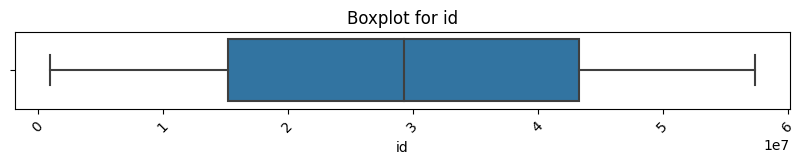

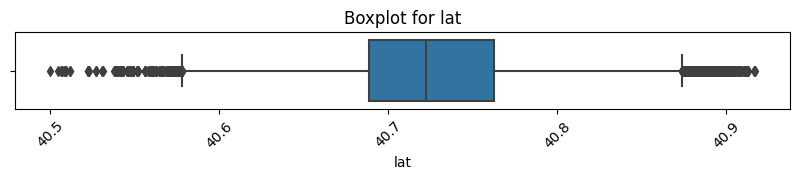

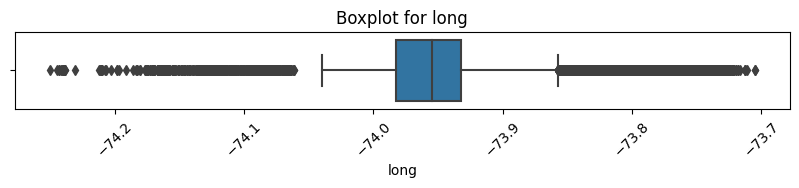

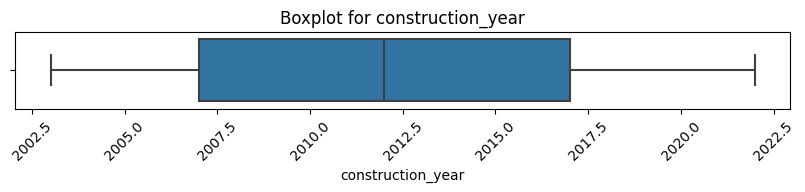

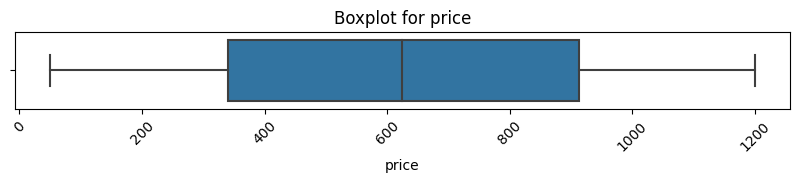

...

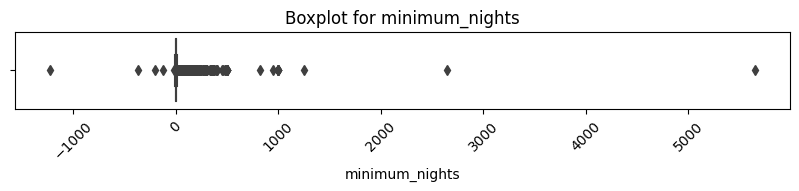

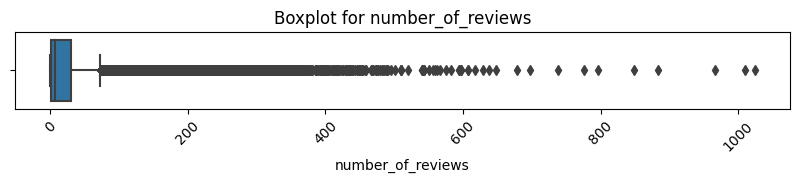

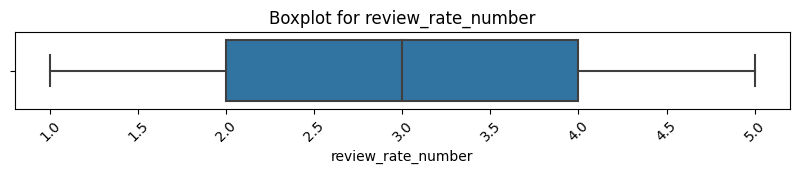

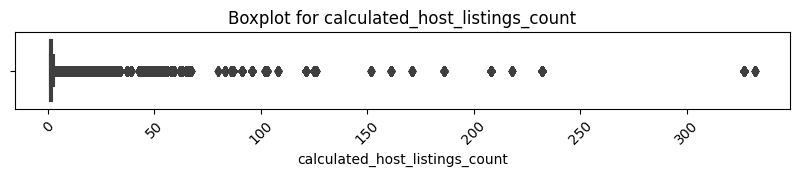

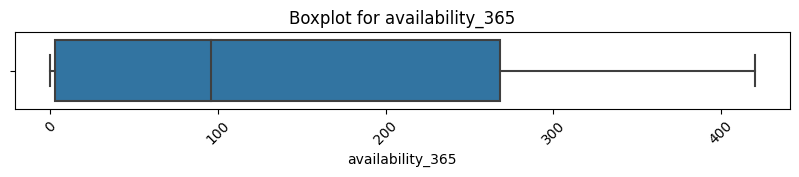

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter kolom yang bukan objek (string)
numeric_columns = df.select_dtypes(exclude=['object'])

# Membuat boxplot untuk setiap kolom numerik secara terpisah
for column in numeric_columns.columns:
    plt.figure(figsize=(10, 1))
    sns.boxplot(x=df[column])
    plt.title(f"Boxplot for {column}")
    plt.xticks(rotation=45)
    plt.show()


In [101]:
numeric_columns.describe().style.background_gradient(cmap='Reds')

,id,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,review_rate_number,calculated_host_listings_count,availability_365
count,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000,100052.000000
mean,29289246.138908,40.728062,-73.949634,2012.487766,625.335835,125.068055,8.038440,27.289479,3.278985,7.963659,140.866010
std,16219604.242243,0.055836,0.049566,5.763782,331.697114,66.342775,28.609995,49.174258,1.284545,32.377606,134.860112
min,1001254.000000,40.499790,-74.249840,2003.000000,50.000000,10.000000,-1223.000000,0.000000,1.000000,1.000000,0.000000
25%,15222923.000000,40.688730,-73.982580,2007.000000,340.000000,68.000000,1.000000,1.000000,2.000000,1.000000,3.000000
50%,29347857.500000,40.722280,-73.954450,2012.000000,625.000000,125.000000,3.000000,7.000000,3.000000,1.000000,96.000000
75%,43343554.000000,40.762750,-73.932340,2017.000000,913.000000,183.000000,5.000000,30.000000,4.000000,2.000000,268.000000
max,57360237.000000,40.916970,-73.705220,2022.000000,1200.000000,240.000000,5645.000000,1024.000000,5.000000,332.000000,420.000000


Insight:
1. lat dan long tidak apa2 ada outlier, karena kan itu cuman koordinat latitude dan longitude
2. minimum_nights ini aneh banget, akan ditinjau ulang
3. number_of_review juga gapapa karena pasti beda2 tiap hotel jumlah yang reviewnya
4. calculated_host_listings_count gapapa banyak outlier karena dia kan jumlah pengunjung hotel

In [102]:
def check_outlier(data, column):
    q1 = data[column].quantile(0.25)
    q3 = data[column].quantile(0.75)
    iqr = q3 - q1
    return ['outlier' if (x<q1-1.5*iqr or x>q3+1.5*iqr) 
                                 else 'not-outlier' for x in data[column].values]

In [103]:
df['outlier_mn'] = check_outlier(data=df, column='minimum_nights')
mn = df[df['outlier_mn'] == 'outlier']

mn['minimum_nights'].value_counts()

30     11357
14      1047
15       569
29       548
31       443
       ...  
175        1
98         1
184        1
153        1
825        1
Name: minimum_nights, Length: 132, dtype: int64

In [104]:
mn['minimum_nights'].describe()

count    16932.000000
mean        34.329672
std         63.152006
min      -1223.000000
25%         30.000000
50%         30.000000
75%         30.000000
max       5645.000000
Name: minimum_nights, dtype: float64

Outliernya banyak, jadi gamungkin kalo didrop semua. Diubah aja dulu
1. Yang negatif, karena nilainya aneh2. Jadi ditarik dulu ke 0
2. batasnya 365, karena aneh kalau orang sewa hotel lebih dari 1 tahun

In [105]:
df.loc[df['minimum_nights'] < 0, 'minimum_nights'] = 0
df.loc[df['minimum_nights'] > 365, 'minimum_nights'] = 365

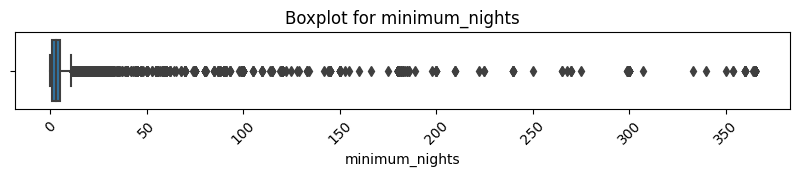

In [106]:
# boxplot yang baru

plt.figure(figsize=(10, 1))
sns.boxplot(x=df["minimum_nights"])
plt.title(f"Boxplot for minimum_nights")
plt.xticks(rotation=45)
plt.show()  

# **Data Visualization**

In [107]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100052 entries, 0 to 102044
Data columns (total 20 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              100052 non-null  int64  
 1   name                            100052 non-null  object 
 2   host_identity_verified          100052 non-null  object 
 3   host_name                       100052 non-null  object 
 4   neighbourhood_group             100052 non-null  object 
 5   neighbourhood                   100052 non-null  object 
 6   lat                             100052 non-null  float64
 7   long                            100052 non-null  float64
 8   instant_bookable                100052 non-null  object 
 9   cancellation_policy             100052 non-null  object 
 10  room_type                       100052 non-null  object 
 11  construction_year               100052 non-null  int32  
 12  price           

## 1. Define the Function
credit: https://www.kaggle.com/code/sayanroy729/airbnb-open-data-eda-step-by-step

In [108]:
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Tahoma'

In [109]:
# Plot Bar Chart

def plot_bar_chart(df, column_name: str, hue: str = None, top_values: int = None, palette: str = "flare", show_grid: bool = True,
                   figsize: tuple = (16, 9), bar_font_size: int = 14, bar_angle: int = 0, angle: int = 0):
    fig = plt.figure(facecolor=(247/255, 247/255, 247/255), figsize=figsize)
    ax = plt.subplot(1, 1, 1)

    ax.set_facecolor((247/255, 247/255, 247/255))
    counts = None

    if top_values is not None:
        counts = df[column_name].value_counts().iloc[:top_values]
    else:
        counts = df[column_name].value_counts()

    bar_ax = sns.barplot(x=counts, y=counts.keys(), palette=palette, ax=ax, hue=df[hue] if hue is not None else None)

    for i in bar_ax.containers:
        bar_ax.bar_label(i, rotation=bar_angle, fontsize=bar_font_size)

    plt.xticks(rotation=angle, fontsize=10)
    plt.xlabel("count", fontweight="bold", fontsize=18)  # Label sumbu x menjadi "count"
    plt.ylabel(f"{column_name}", fontweight="bold", fontsize=18)  # Label sumbu y menjadi nama kolom
    plt.title(f"Top {top_values} {column_name}" if top_values is not None else f"{column_name}", fontsize=27)
    
    if show_grid:
        plt.grid()

In [110]:
# Pie Chart

def plot_pie_chart(column_name: str, startangle: int=45, loc: str="center", explodes: float=0.09, palette: str = "magma"):
    values = df[column_name].value_counts()
    keys = values.keys()
    total_records = df[column_name].count()

    labels = ["{0} - {1:1.2f} %".format(i, j/total_records * 100) for i, j in zip(keys, values)]
    explodes = [explodes/len(keys) for i in range(len(keys))]

    plt.subplots(figsize=(16, 9))
    
    # Mengatur palet berdasarkan nilai "palette"
    sns.set_palette(palette)
    
    # Menggambar diagram lingkaran dengan palet yang telah diatur
    patches, texts = plt.pie(values, startangle=startangle, explode=explodes)

    center_circle = plt.Circle(xy=(0, 0), radius=0.70, fc="white")
    fig = plt.gcf()
    fig.gca().add_artist(center_circle)
    plt.legend(patches, labels, loc=loc, fontsize=14)

In [111]:
# Line Chart

def plot_line_chart(column_name, xlabel, ylabel, title, palette="magma"):
    # Count values and sort by index
    value = df[column_name].value_counts().sort_index()
    keys = np.array(value.keys(), dtype=np.int16)

    # Set a custom color palette
    custom_palette = sns.color_palette(palette, len(value))

    # Create a figure and axis with a white background
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.set_facecolor((1.0, 1.0, 1.0))

    # Plot the line chart with custom styling
    sns.lineplot(x=keys, y=value.values, ax=ax, marker='o', markersize=8, color=custom_palette[0], markerfacecolor='none', markeredgewidth=2, markeredgecolor='red', linewidth=2)

    # Add grid lines
    ax.grid(True, linestyle='--', alpha=0.7, color='gray')

    # Customize axis labels and title
    plt.xlabel(xlabel, fontsize=14, fontweight="bold")
    plt.ylabel(ylabel, fontsize=14, fontweight="bold")
    plt.xticks(ticks=keys, fontsize=12, rotation=15)
    plt.title(title, fontsize=16, fontweight="bold")

## 2. Simple Visualization

**Top 10 Air bnb Name**
Tidak menaruh data nama dengan value "none" atau "#NAME?"

Text(0.35, 1.08, 'Top 10 Air BnB at United States')

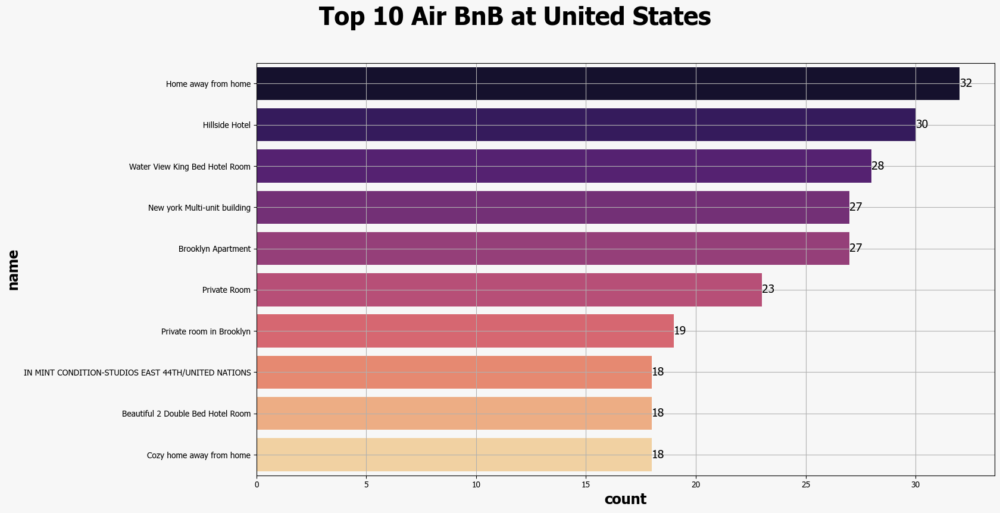

In [112]:
filtered_df = df[(df["name"] != "none") & (df["name"] != "#NAME?")]
plot_bar_chart(filtered_df, column_name="name", top_values=10, palette="magma", show_grid=True)

plt.title("Top 10 Air BnB at United States", fontsize=30, fontweight="bold", ha="center", y = 1.08, x = 0.35)

**Verified Host Identity**

Text(0.5, 1.0, 'Verrified Host Identity')

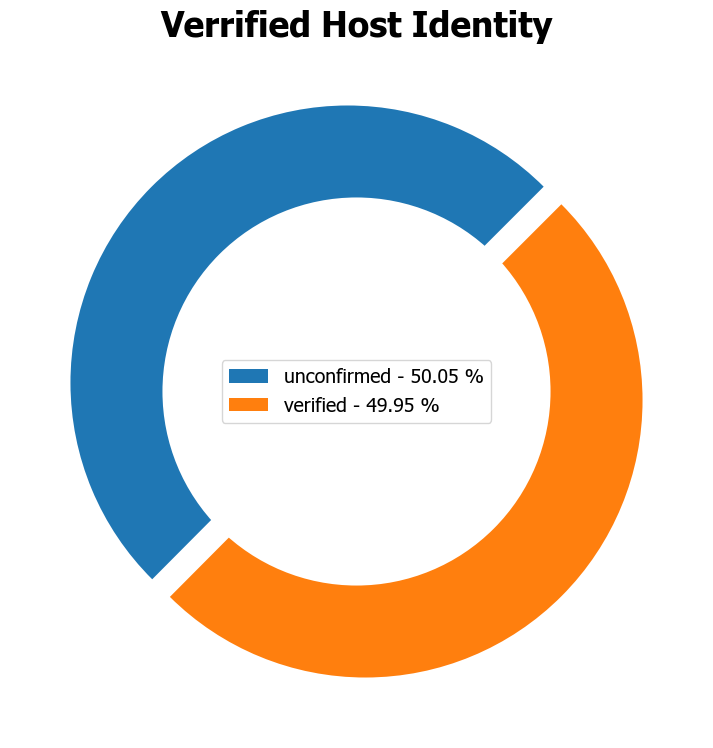

In [113]:
plot_pie_chart(column_name= "host_identity_verified", palette = "magma")
plt.title("Verrified Host Identity", fontsize=25, fontweight="bold")

**Top 10 Host Name**

Text(0.5, 1.08, 'Top 10 Air BnB Host Name')

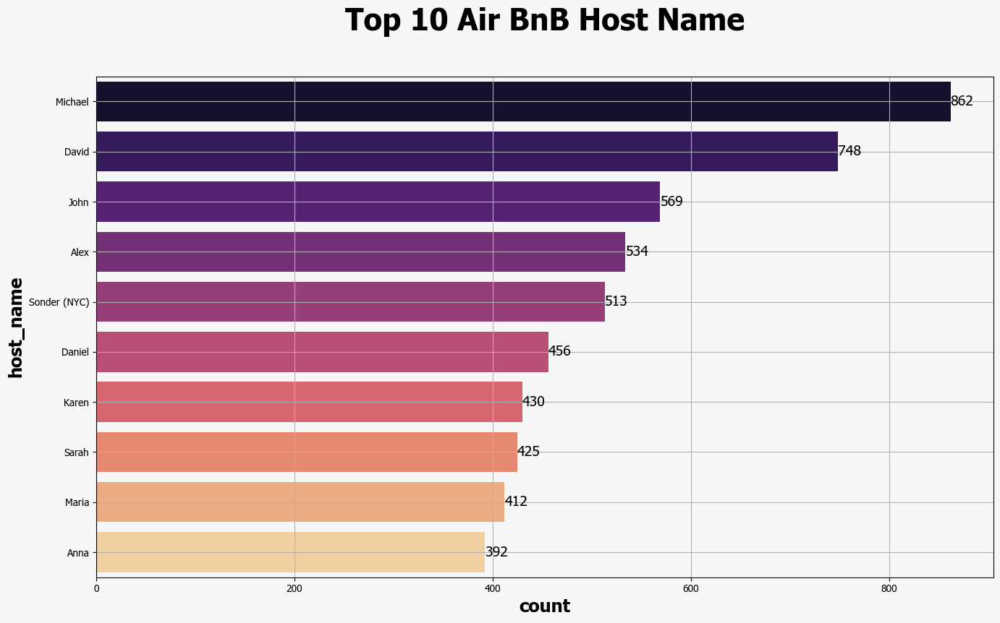

In [114]:
plot_bar_chart(df, column_name="host_name", top_values=10, palette="magma", show_grid=True)

plt.title("Top 10 Air BnB Host Name", fontsize=30, fontweight="bold", ha="center", y = 1.08, x = 0.5)

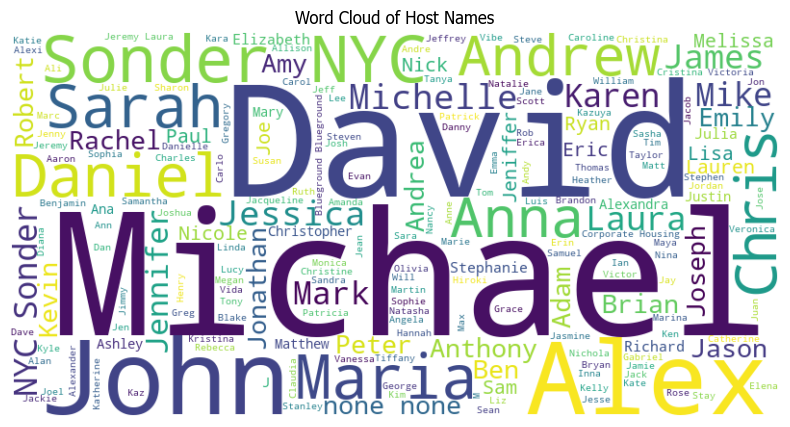

In [115]:
from wordcloud import WordCloud
host_names = df["host_name"]
host_names = ' '.join(df['host_name'])

# Membuat awan kata
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(host_names)

# Menampilkan awan kata
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Host Names')
plt.show()

**Neighbourhood Group**

Text(0.5, 1.08, 'Air BnB Neighbourhood Group')

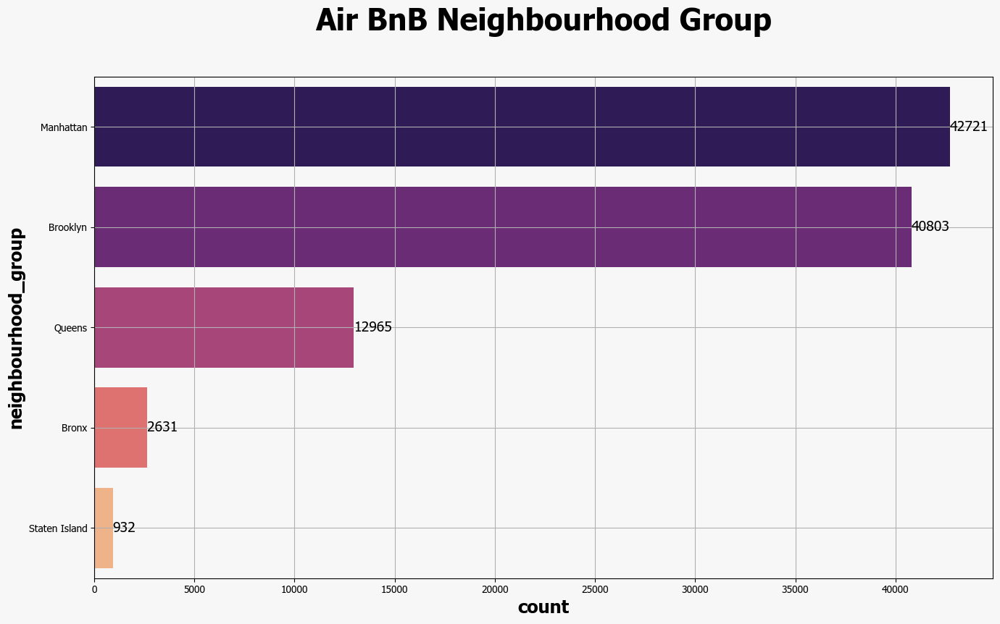

In [116]:
plot_bar_chart(df, column_name="neighbourhood_group", palette="magma", show_grid=True)

plt.title("Air BnB Neighbourhood Group", fontsize=30, fontweight="bold", ha="center", y = 1.08, x = 0.5)

**Top 10 Neighbourhood**

Text(0.5, 1.08, 'Top 10 Neighbourhood Air BnB Group')

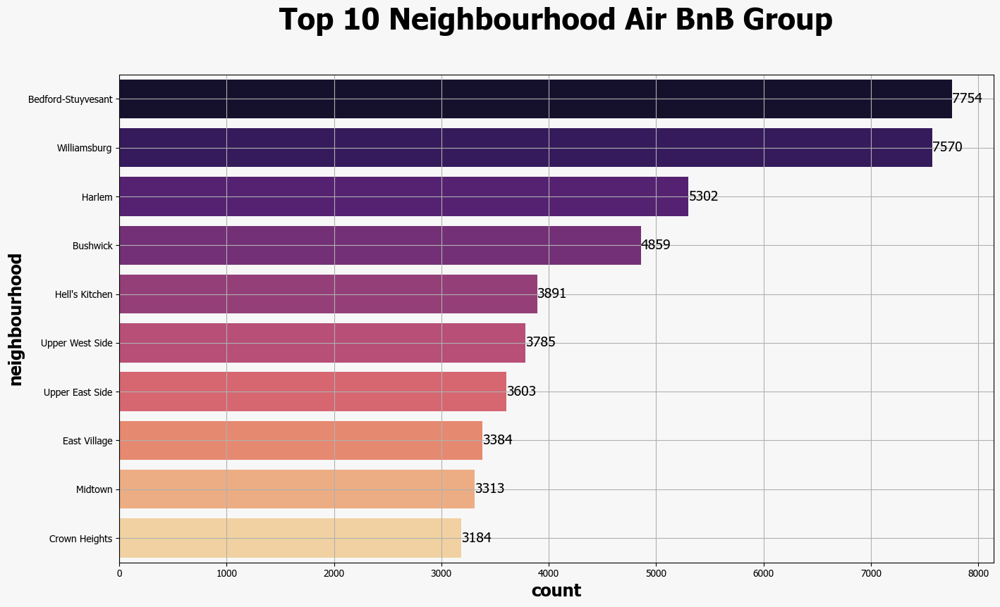

In [117]:
plot_bar_chart(df, column_name="neighbourhood", top_values=10, palette="magma", show_grid=True)

plt.title("Top 10 Neighbourhood Air BnB Group", fontsize=30, fontweight="bold", ha="center", y = 1.08, x = 0.5)

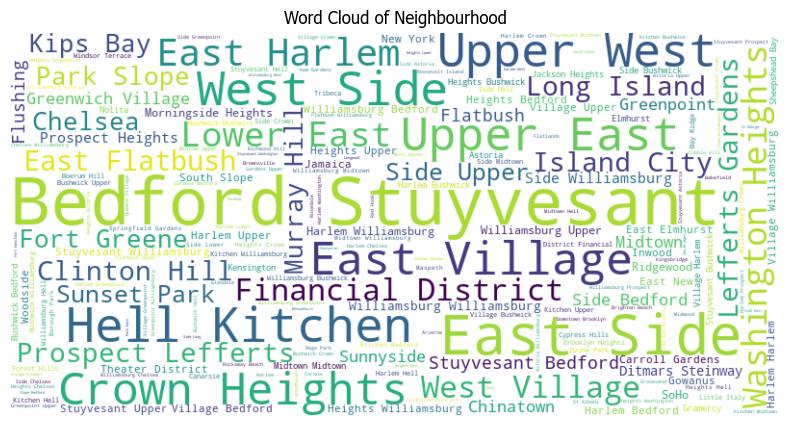

In [118]:
from wordcloud import WordCloud
host_names = df["neighbourhood"]
host_names = ' '.join(df['neighbourhood'])

# Membuat awan kata
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(host_names)

# Menampilkan awan kata
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Neighbourhood')
plt.show()

**Lat and Long**

C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\77694783.py:6: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  gpd.datasets.get_path("naturalearth_lowres")


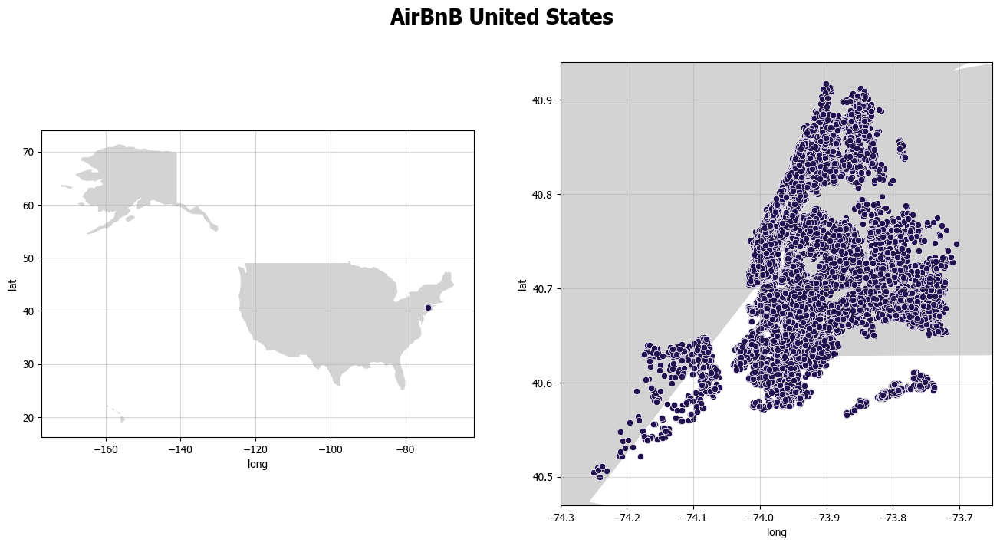

In [119]:
import geopandas as gpd

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(16,16))

countries = gpd.read_file(
     gpd.datasets.get_path("naturalearth_lowres")
)

countries[countries["name"] == "United States of America"].plot(color="lightgrey", ax=ax[0])
countries[countries["name"] == "United States of America"].plot(color="lightgrey", ax=ax[1])

sns.scatterplot(x = "long", y = "lat", data = df, ax = ax[0])
sns.scatterplot(x = "long", y = "lat", data = df, ax = ax[1])
ax[0].grid(visible=True, alpha=0.5)
ax[1].grid(visible=True, alpha=0.5)

ax[1].set_xlim([-74.3, -73.65])
ax[1].set_ylim([40.47, 40.94])

plt.suptitle("AirBnB United States", x = 0.5, y = 0.72, fontweight = "bold", fontsize = 20)
plt.show()

**Instant Bookable**

Text(0.5, 1.0, 'instant Bookable')

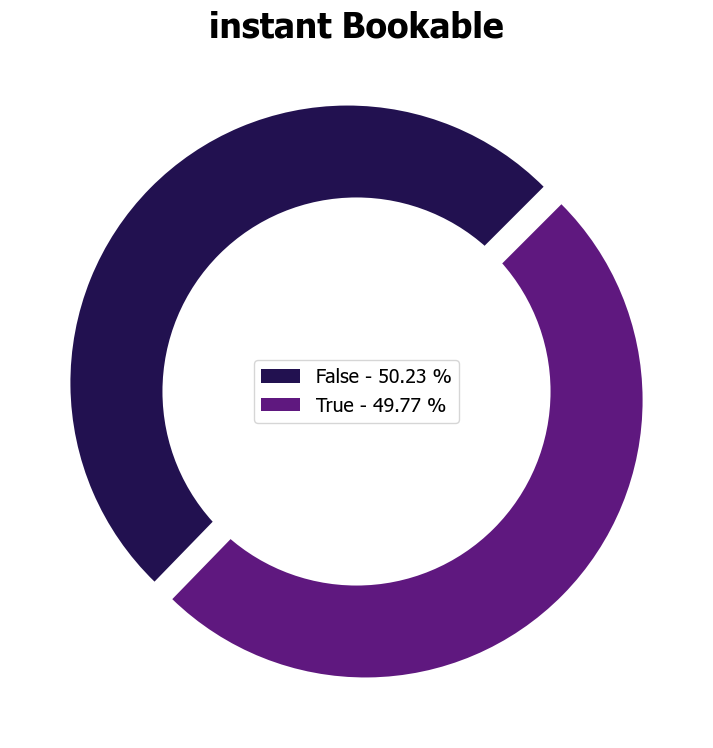

In [120]:
plot_pie_chart(column_name= "instant_bookable", palette = "magma")
plt.title("instant Bookable", fontsize=25, fontweight="bold")

**Cancellation Policy**

Text(0.5, 1.0, 'Cancellation Policy')

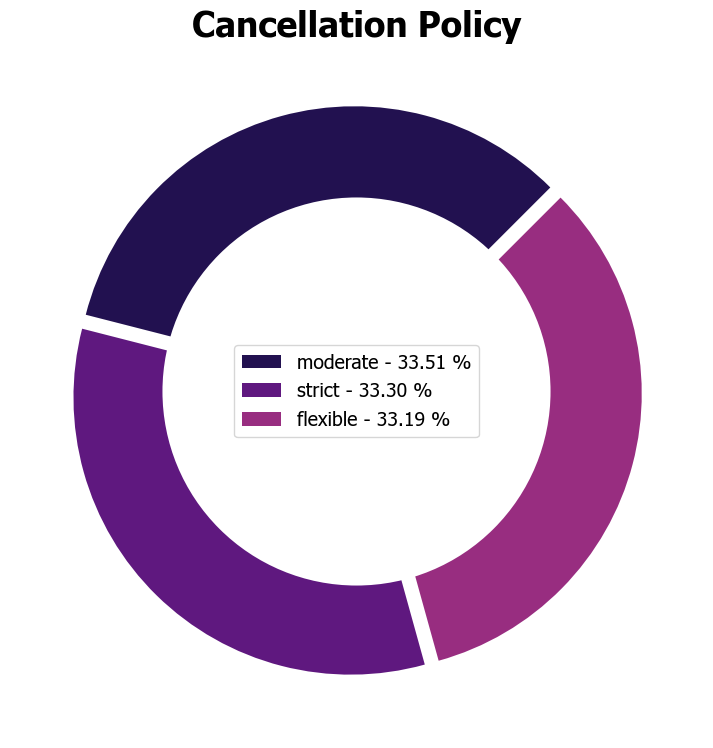

In [121]:
plot_pie_chart(column_name= "cancellation_policy", palette = "magma")
plt.title("Cancellation Policy", fontsize=25, fontweight="bold")

**Room  Type**

Text(0.5, 1.08, 'Room Type')

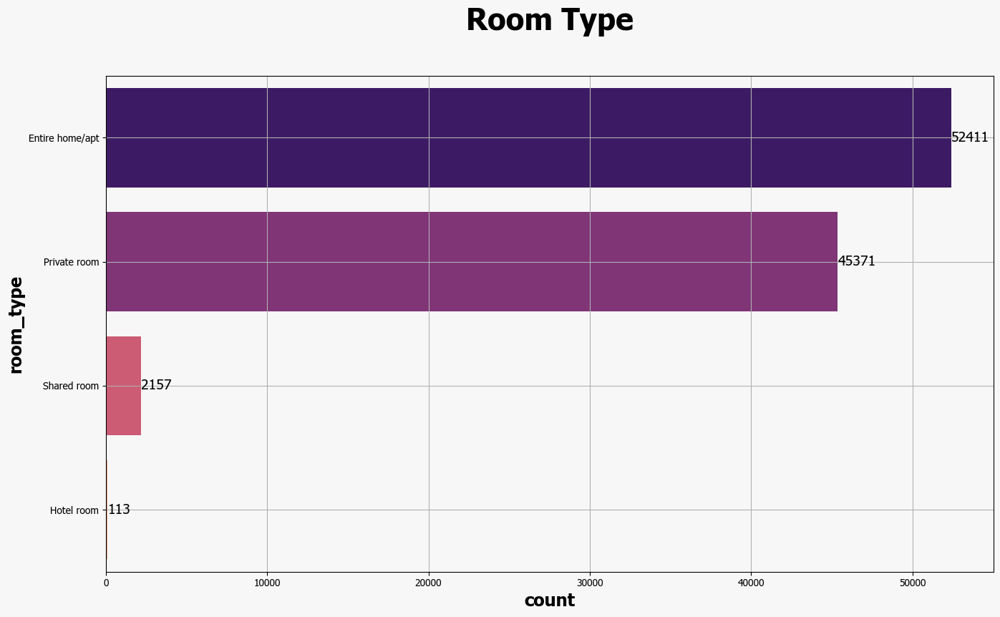

In [122]:
plot_bar_chart(df, column_name="room_type", top_values=10, palette="magma", show_grid=True)

plt.title("Room Type", fontsize=30, fontweight="bold", ha="center", y = 1.08, x = 0.5)

**Construction Year**

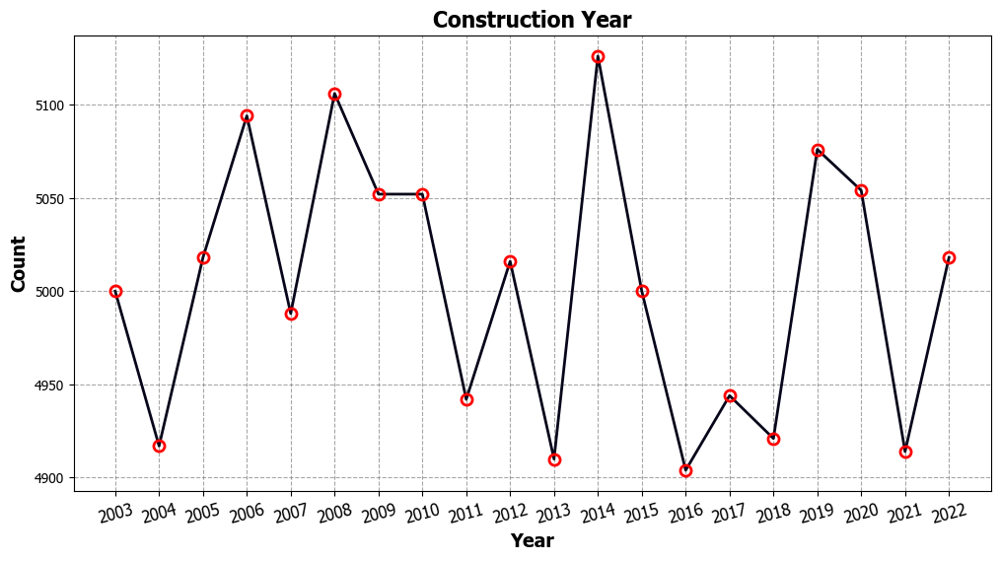

In [123]:
plot_line_chart("construction_year", "Year", "Count", "Construction Year")

## 3. EDA Question

**What is the most expensive and cheapest neighbourhood?**

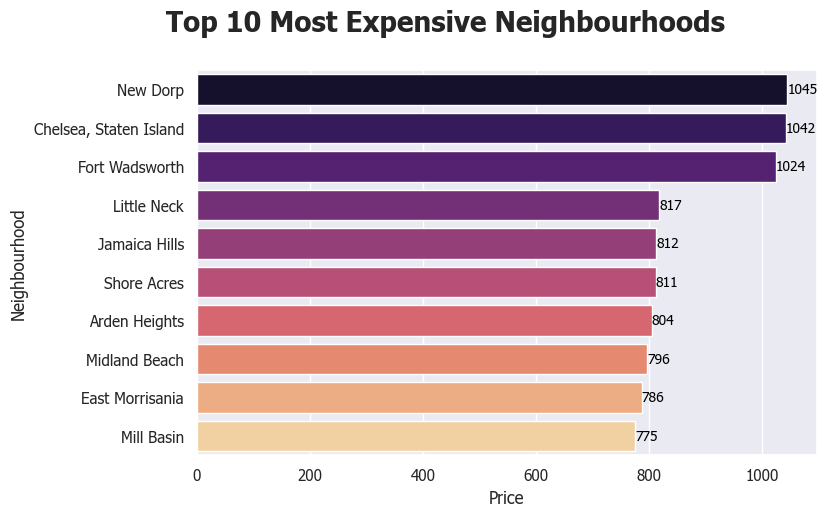

In [124]:
largest = df.groupby('neighbourhood')['price'].mean().nlargest(10).reset_index()
sns.set(font='Tahoma')

# Barplot 1 with 'magma' palette
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=largest, x='price', y='neighbourhood', palette='magma')
plt.title('Top 10 Most Expensive Neighbourhoods', fontsize=20, fontweight="bold", ha="center", y=1.08, x=0.4)
plt.xlabel('Price')
plt.ylabel('Neighbourhood')

# Add count above each bar
for p in ax.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10, color='black')

plt.show()


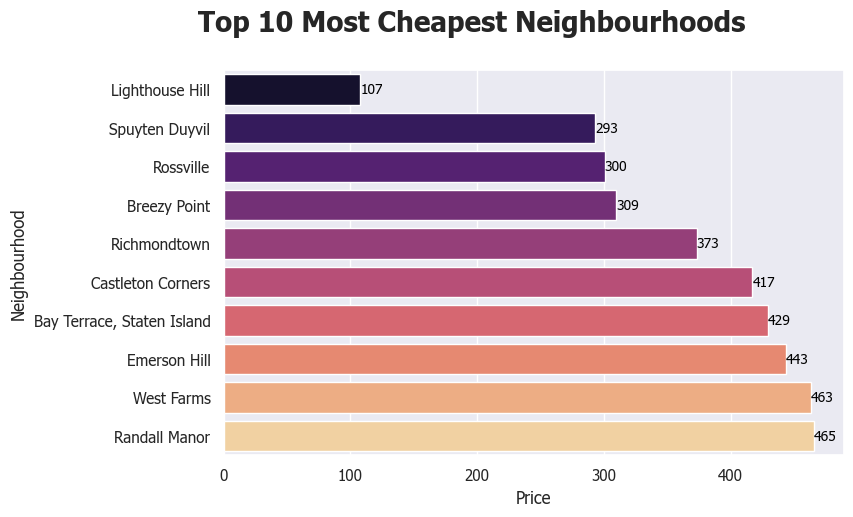

In [125]:
cheapest = df.groupby('neighbourhood')['price'].mean().nsmallest(10).reset_index()
sns.set(font='Tahoma')

# Barplot 1 with 'magma' palette
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=cheapest, x='price', y='neighbourhood', palette='magma')
plt.title('Top 10 Most Cheapest Neighbourhoods', fontsize=20, fontweight="bold", ha="center", y=1.08, x=0.4)
plt.xlabel('Price')
plt.ylabel('Neighbourhood')

# Add count above each bar
for p in ax.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10, color='black')

plt.show()


**What is the most good reviews neighbourhood?**

In [126]:
good_review = df.groupby('neighbourhood')['review_rate_number'].mean().nlargest(10).reset_index()
good_review

,neighbourhood,review_rate_number
0,Glen Oaks,4.500000
1,Co-op City,4.400000
2,Gerritsen Beach,4.333333
3,Huguenot,4.111111
4,Eltingville,4.000000
5,Silver Lake,4.000000
6,Todt Hill,4.000000
7,West Farms,4.000000
8,Woodrow,4.000000
9,Rosebank,3.928571


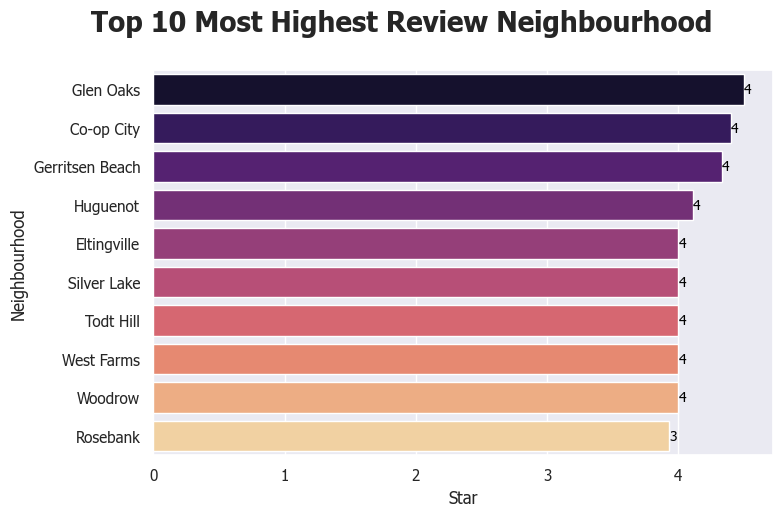

In [127]:
good_review = df.groupby('neighbourhood')['review_rate_number'].mean().nlargest(10).reset_index()
sns.set(font='Tahoma')

# Barplot 1 with 'magma' palette
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=good_review, x='review_rate_number', y='neighbourhood', palette='magma')
plt.title('Top 10 Most Highest Review Neighbourhood', fontsize=20, fontweight="bold", ha="center", y=1.08, x=0.4)
plt.xlabel('Star')
plt.ylabel('Neighbourhood')

# Add count above each bar
for p in ax.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10, color='black')

plt.show()


**Correlation between rate and neighbourhood's price?**

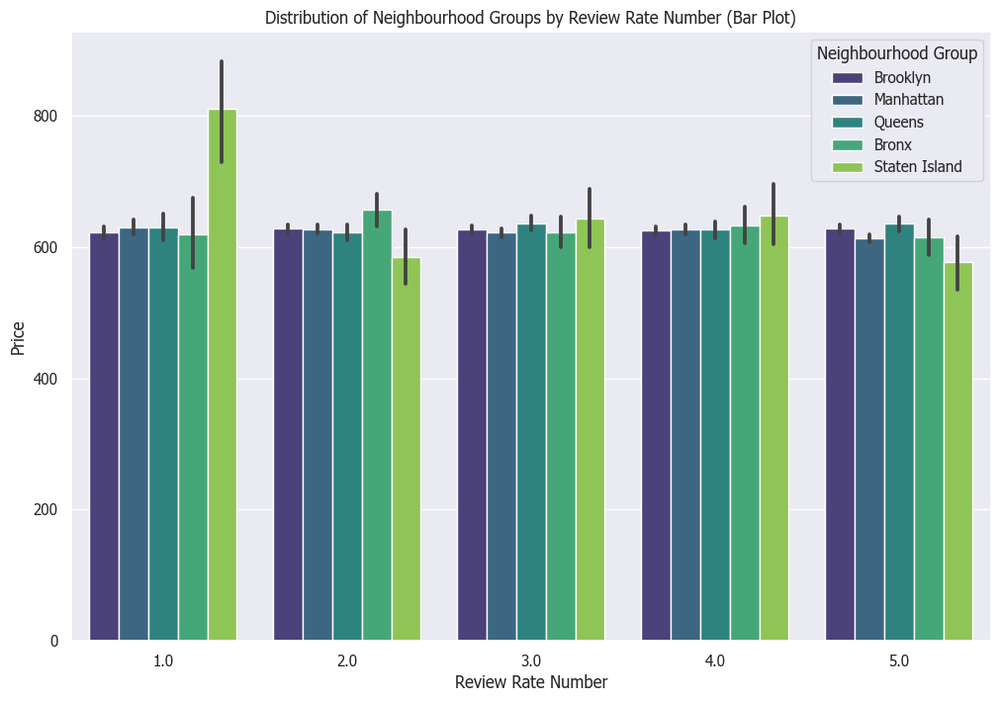

In [128]:
import seaborn as sb
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sb.barplot(data=df, x='review_rate_number', y='price', hue='neighbourhood_group', palette='viridis')
plt.xlabel('Review Rate Number')
plt.ylabel('Price')
plt.title('Distribution of Neighbourhood Groups by Review Rate Number (Bar Plot)')
plt.legend(title='Neighbourhood Group')
plt.show()


****How many days people rent the rooms?****

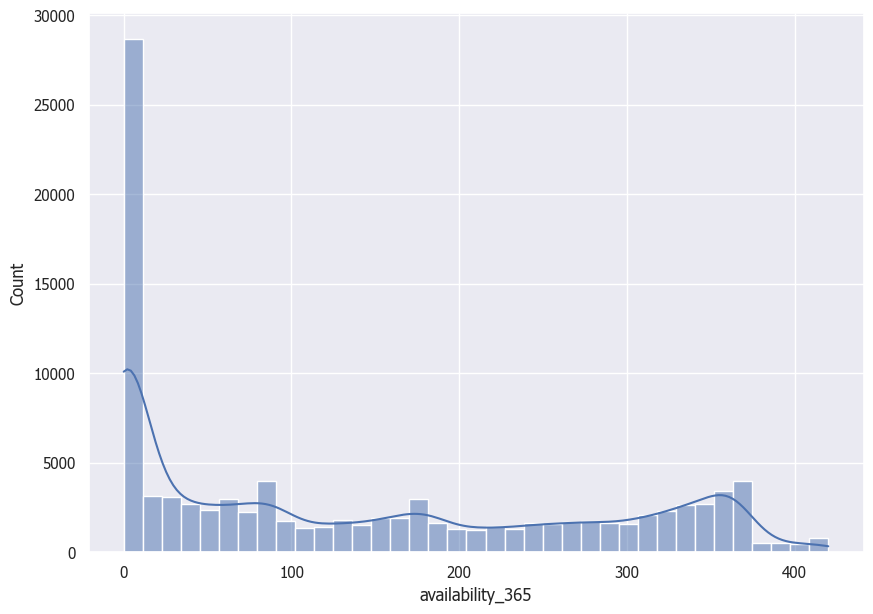

In [129]:
plt.figure(figsize=(10,7))
sns.histplot(data=df, x='availability_365', kde=True)
plt.show()

**How about each neighbourhood group?**

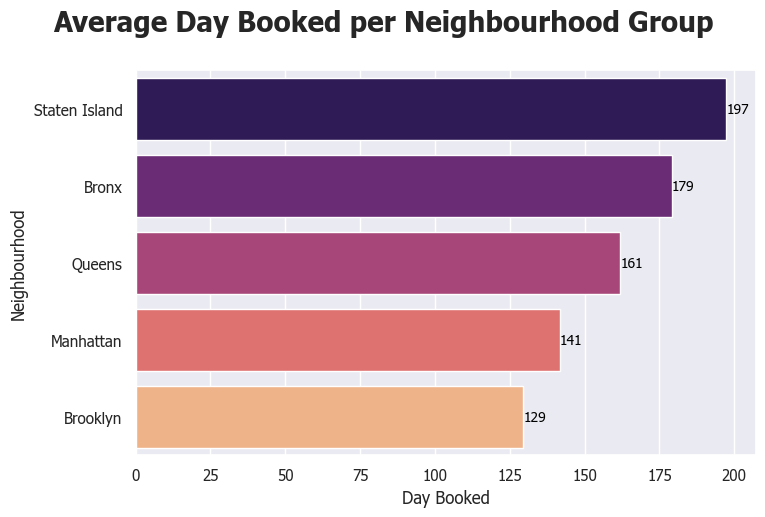

In [130]:
avg_avail = df.groupby('neighbourhood_group')['availability_365'].mean().nlargest(10).reset_index()
sns.set(font='Tahoma')

# Barplot 1 with 'magma' palette
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=avg_avail, x='availability_365', y='neighbourhood_group', palette='magma')
plt.title('Average Day Booked per Neighbourhood Group', fontsize=20, fontweight="bold", ha="center", y=1.08, x=0.4)
plt.xlabel('Day Booked')
plt.ylabel('Neighbourhood')

# Add count above each bar
for p in ax.patches:
    width = p.get_width()
    plt.text(width, p.get_y() + p.get_height() / 2, f'{int(width)}', ha='left', va='center', fontsize=10, color='black')

plt.show()


**Distribution of prices by its location**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


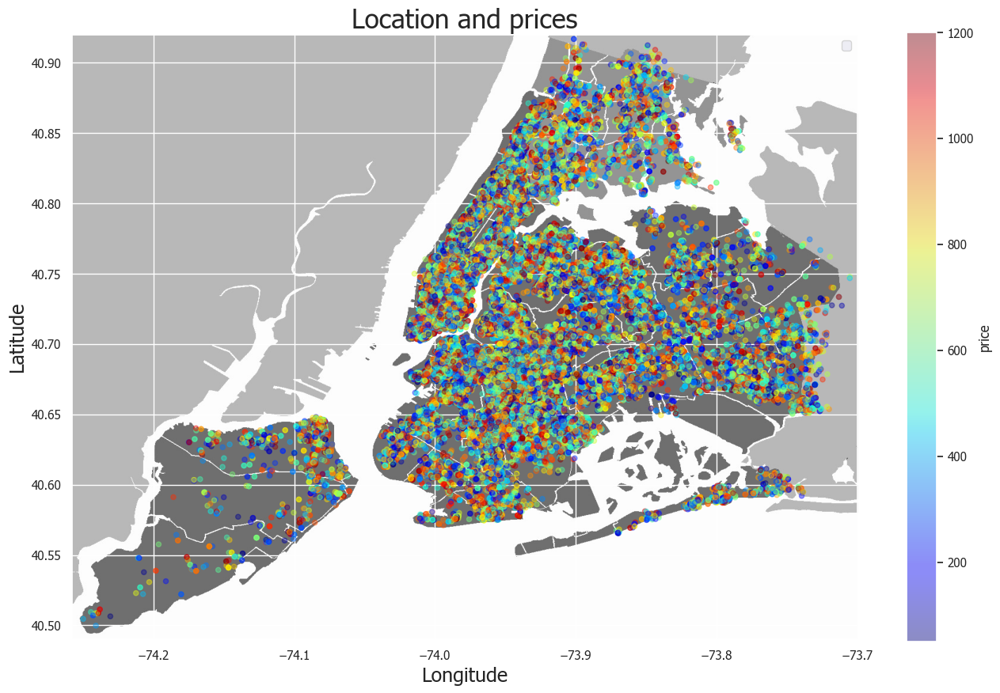

In [131]:
plt.figure(figsize=(16,10))
nyc_img=plt.imread("New_York_City.png", 0) #without the 0 we get an "invalid png header" error

#scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()

#using scatterplot
df.plot(kind='scatter', x='long', y='lat', c='price', ax=ax, 
           cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, zorder=5)
plt.legend()
plt.title('Location and prices', fontsize= 24)
plt.xlabel('Longitude', fontsize = 18)
plt.ylabel('Latitude', fontsize = 18)

plt.show()

**Neighbourhood Segmentation**

In [132]:
lat_mean = df['lat'].mean()
long_mean = df['long'].mean()
area_lat = df['lat'].groupby(df['neighbourhood_group']).mean()
area_long = df['long'].groupby(df['neighbourhood_group']).mean()
area_lat_long= pd.concat([area_lat,area_long],axis=1)
area_lat_long = area_lat_long.values.tolist()

In [133]:
import folium
map = folium.Map(
                  # Center the map here
                  location=[lat_mean,long_mean],
                  zoom_start = 10
                )  
for point in range(0, len(area_lat_long)):
  _=folium.Marker(
                      area_lat_long[point],
                      popup = area_lat_long[point]
                      ).add_to(map)
map

**Is Host verified affected the price?**

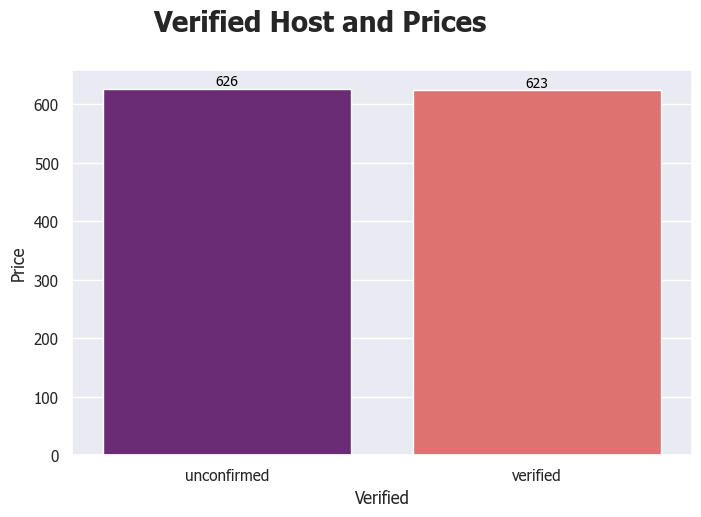

In [134]:
verif = df.groupby('host_identity_verified')['price'].mean().nlargest(10).reset_index()
sns.set(font='Tahoma')

# Barplot 1 with 'magma' palette
plt.figure(figsize=(8, 5))
ax = sns.barplot(data=verif, x='host_identity_verified', y='price', palette='magma')
plt.title('Verified Host and Prices', fontsize=20, fontweight="bold", ha="center", y=1.08, x=0.4)
plt.xlabel('Verified')
plt.ylabel('Price')

# Add count above each bar
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height, f'{int(height)}', ha='center', va='bottom', fontsize=10, color='black')

plt.show()


**Location and Room Types**

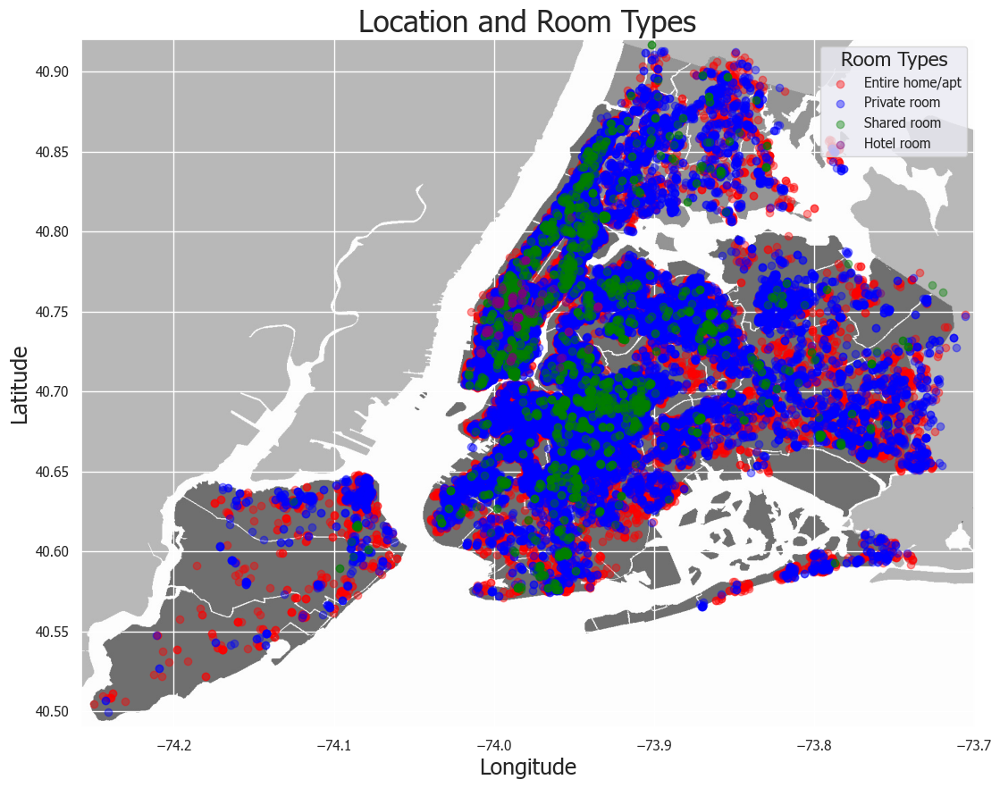

In [135]:
plt.figure(figsize=(50, 10))
nyc_img = plt.imread("New_York_City.png", 0)

# Scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(nyc_img, zorder=0, extent=[-74.258, -73.7, 40.49, 40.92])
ax = plt.gca()

# Mapping room types to categorical codes
room_type_codes = {'Entire home/apt': 0, 'Private room': 1, 'Shared room': 2, 'Hotel room': 3}
df['room_type_code'] = df['room_type'].map(room_type_codes)

# Define a list of room types and corresponding colors
room_types = list(room_type_codes.keys())
colors = ['red', 'blue', 'green', 'purple']  # You can customize the colors

# Create scatterplots for each room type
for i, room_type in enumerate(room_types):
    room_df = df[df['room_type'] == room_type]
    ax.scatter(room_df['long'], room_df['lat'], label=room_type, color=colors[i], alpha=0.4, zorder=5)

# Display the legend
legend = ax.legend(loc='upper right', title='Room Types', title_fontsize=16)

plt.title('Location and Room Types', fontsize=24)
plt.xlabel('Longitude', fontsize=18)
plt.ylabel('Latitude', fontsize=18)

plt.show()

**How about price and rate?**

([<matplotlib.axis.XTick at 0x2619a45c790>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

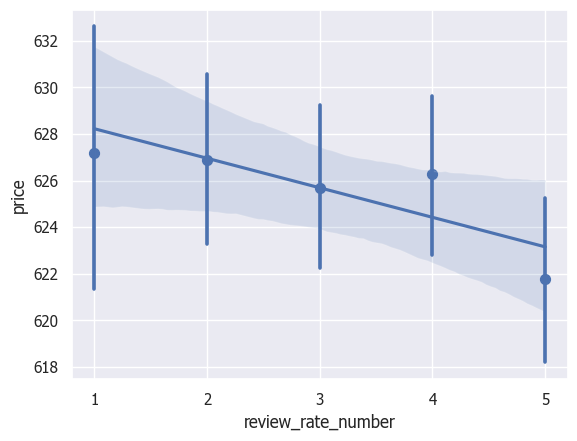

In [136]:
sb.regplot(data = df, x='review_rate_number',y='price',x_jitter=.2,x_bins=[1,2,3,4,5]
          ,ci=90)
plt.xticks([1,2,3,4,5])

**Price and Room Type**

<Figure size 600x600 with 0 Axes>

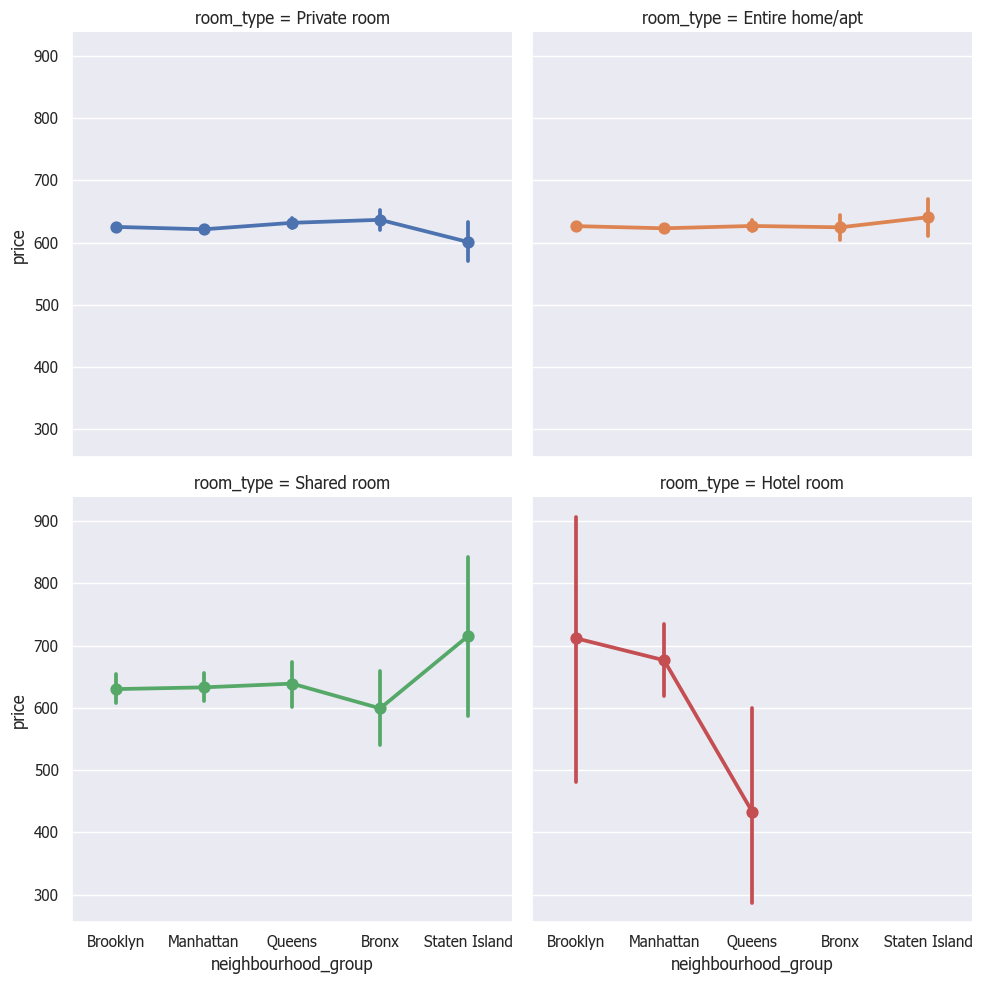

In [137]:
plt.figure(figsize=(6,6))
sb.catplot(x='neighbourhood_group',y='price',data=df,hue='room_type',kind='point',
          col='room_type', col_wrap=2)

**Review based on room type**

<Figure size 600x600 with 0 Axes>

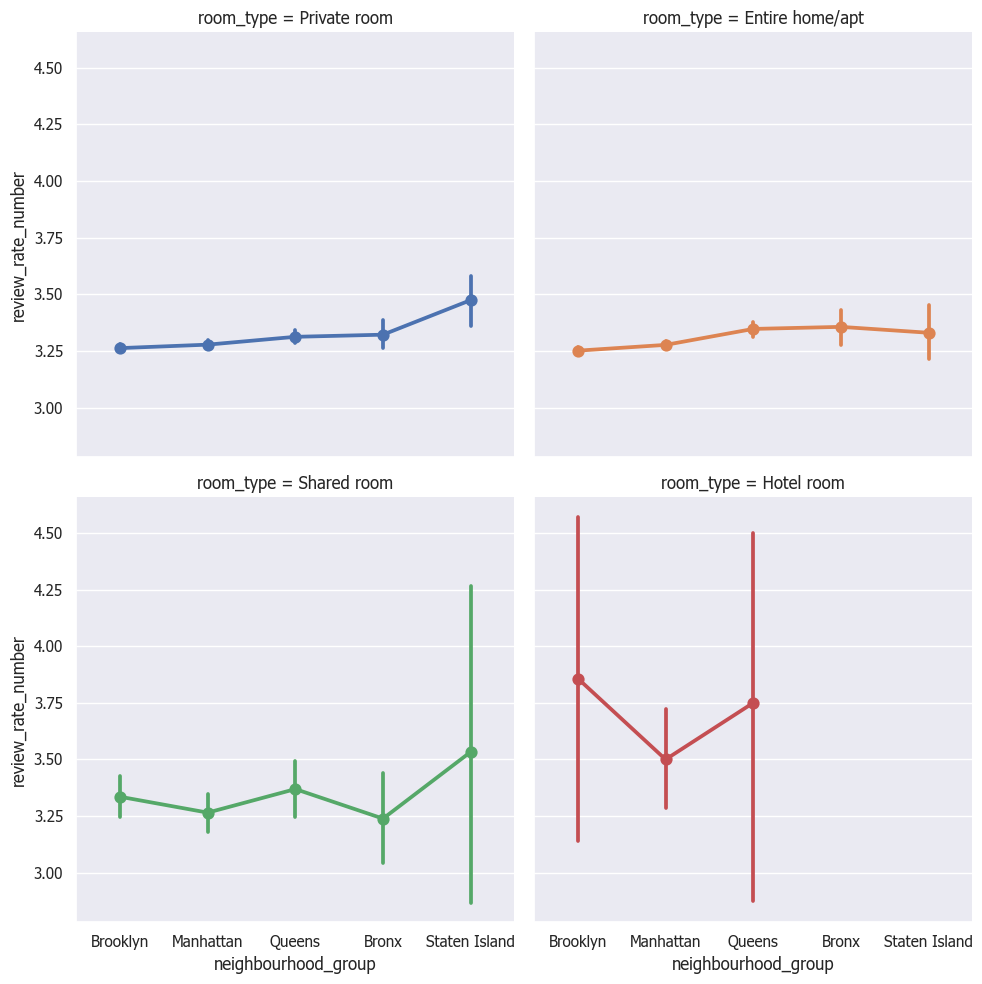

In [138]:
plt.figure(figsize=(6,6))
sb.catplot(x='neighbourhood_group',y='review_rate_number',data=df,hue='room_type',kind='point',
          col='room_type', col_wrap=2)

In [139]:
numeric_columns

,id,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,review_rate_number,calculated_host_listings_count,availability_365
0,1001254,40.64749,-73.97237,2020,966.0,193.0,10,9,4.0,6.0,286.0
1,1002102,40.75362,-73.98377,2007,142.0,28.0,30,45,4.0,2.0,228.0
3,1002755,40.68514,-73.95976,2005,368.0,74.0,30,270,4.0,1.0,322.0
4,1003689,40.79851,-73.94399,2009,204.0,41.0,10,9,3.0,1.0,289.0
5,1004098,40.74767,-73.97500,2013,577.0,115.0,3,74,3.0,1.0,374.0
...,...,...,...,...,...,...,...,...,...,...,...
102040,57358028,40.76245,-73.87938,2022,982.0,196.0,1,239,2.0,2.0,361.0
102041,57358580,40.59380,-73.77373,2020,946.0,189.0,1,76,1.0,1.0,324.0
102042,57359133,40.79712,-73.96117,2012,706.0,141.0,1,4,4.0,1.0,0.0
102043,57359685,40.72318,-74.00223,2020,1043.0,209.0,2,21,4.0,2.0,343.0


**Numerical Distribution**

In [140]:
cat_columns.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100052 entries, 0 to 102044
Data columns (total 8 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   name                    100052 non-null  object
 1   host_identity_verified  100052 non-null  object
 2   host_name               100052 non-null  object
 3   neighbourhood_group     100052 non-null  object
 4   neighbourhood           100052 non-null  object
 5   instant_bookable        100052 non-null  object
 6   cancellation_policy     100052 non-null  object
 7   room_type               100052 non-null  object
dtypes: object(8)
memory usage: 6.9+ MB


In [141]:
columns_to_drop = ["name", "host_name"]
cat_columns.drop(columns=columns_to_drop, inplace=True)

In [142]:
cat_columns.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100052 entries, 0 to 102044
Data columns (total 6 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   host_identity_verified  100052 non-null  object
 1   neighbourhood_group     100052 non-null  object
 2   neighbourhood           100052 non-null  object
 3   instant_bookable        100052 non-null  object
 4   cancellation_policy     100052 non-null  object
 5   room_type               100052 non-null  object
dtypes: object(6)
memory usage: 5.3+ MB


In [143]:
def bar_kebalik(data, column_name, top_values=50, palette="magma", show_grid=True):
    """
    Plots a bar chart for the specified categorical column.

    Parameters:
        data (DataFrame): The DataFrame containing the data.
        column_name (str): The name of the categorical column to plot.
        top_values (int): The number of top values to display (default is 10).
        palette (str): The color palette to use for the bars (default is "magma").
        show_grid (bool): Whether to show grid lines (default is True).
    """
    # Count the frequency of each category
    category_counts = data[column_name].value_counts().head(top_values)
    
    sns.set(style="whitegrid" if show_grid else "white")
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=category_counts.index, y=category_counts.values, palette=palette)
    
    # Customize the plot
    plt.title(f"Top {top_values} {column_name} Categories", fontsize=16, fontweight="bold")
    plt.xlabel(column_name, fontsize=12)
    plt.ylabel("Count", fontsize=12)
    
    # Show the plot
    plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
    
    # Add values (counts) above each bar
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

Text(0.5, 1.08, 'Room Type')

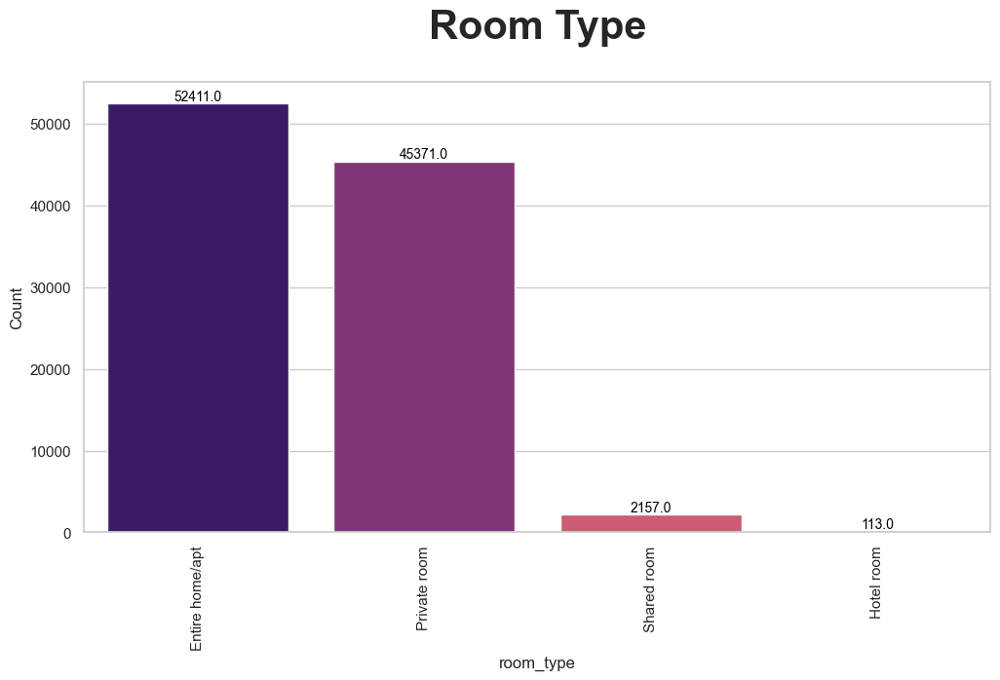

In [144]:
bar_kebalik(cat_columns, column_name="room_type", top_values=50, palette="magma", show_grid=True)

plt.title("Room Type", fontsize=30, fontweight="bold", ha="center", y = 1.08, x = 0.5)

C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\775428593.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  g = sns.distplot(df[column], color='red')


C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\775428593.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  g = sns.distplot(df[column], color='red')
C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\775428593.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  g = sns.distplot(df[column], color='red')
C:\Users

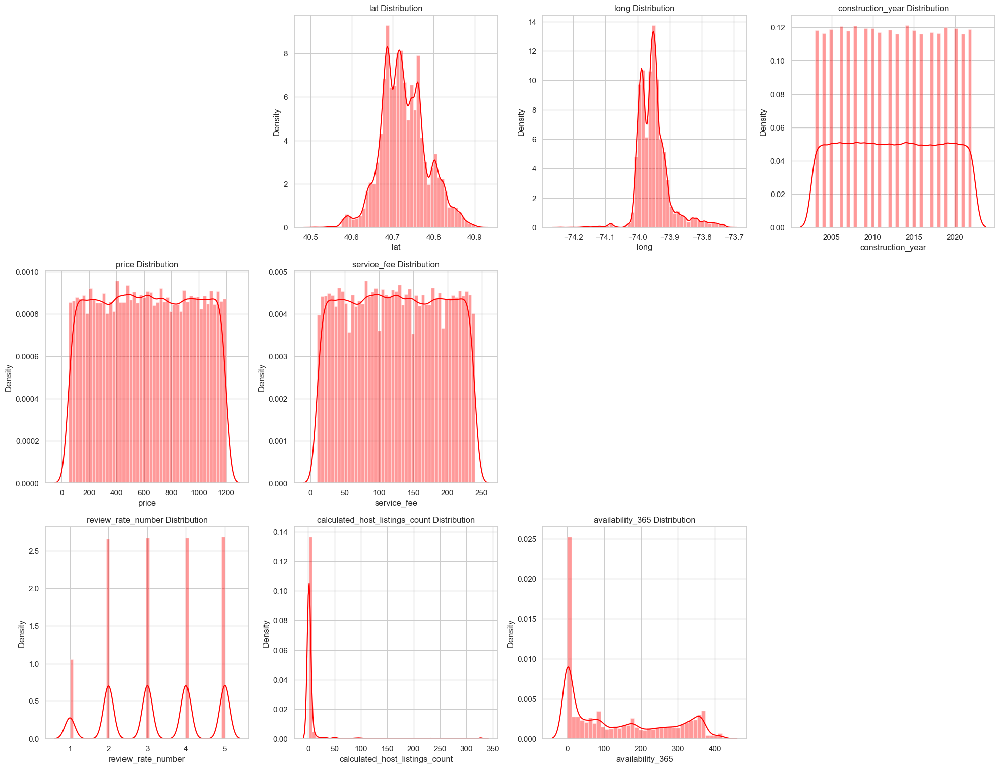

In [145]:
plt.figure(figsize=(20, 20))

# Loop melalui semua kolom di DataFrame kecuali yang berisi string atau objek lainnya
num_rows = 4  # Jumlah baris subplot
num_cols = 4  # Jumlah kolom subplot
total_subplots = num_rows * num_cols  # Total subplot yang diizinkan

for i, column in enumerate(numeric_columns.columns):
    if df[column].dtype in [int, float]:
        if i < total_subplots:
            plt.subplot(num_rows, num_cols, i + 1)
            g = sns.distplot(df[column], color='red')
            plt.title(f'{column} Distribution')
        else:
            break  # Keluar dari loop jika subplot sudah mencapai batas yang diizinkan

plt.tight_layout()
plt.show()

**Mean review count vs review rate**

In [146]:
df.groupby(['review_rate_number']).agg(
   review_count = ('number_of_reviews','mean')
)

,review_count
review_rate_number,
1.0,32.653281
2.0,26.738879
3.0,26.528063
4.0,26.628490
5.0,27.142514


**Mean price by rate and room type**

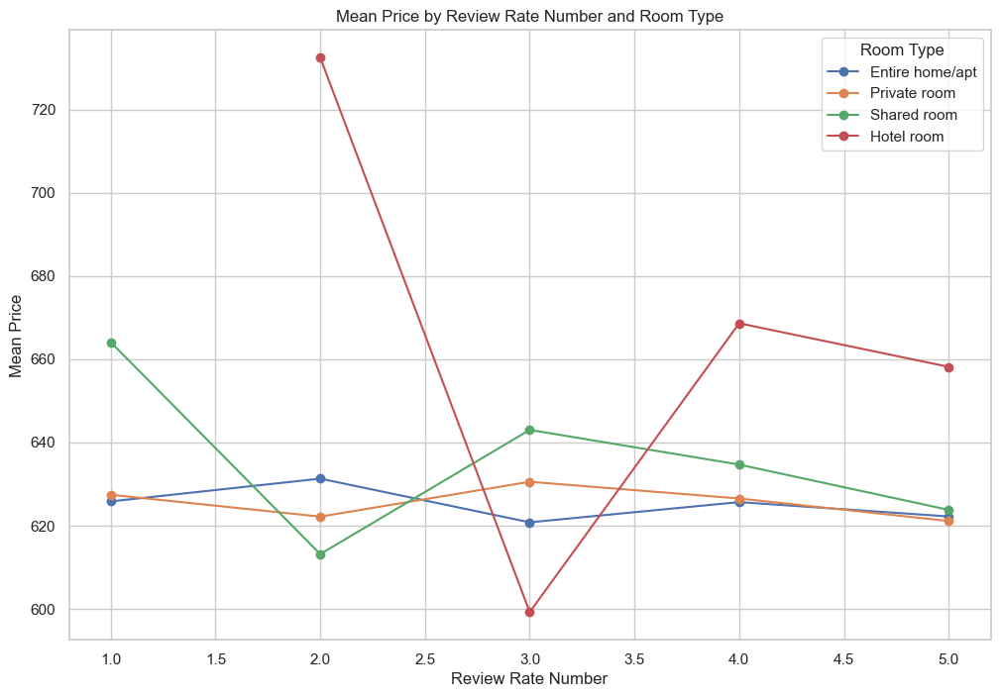

In [147]:
mean_price_room_type = df.groupby(['review_rate_number','room_type']).agg(
    mean_price =('price','mean')
).reset_index()

# Mengatur ukuran gambar
plt.figure(figsize=(12, 8))

# Loop melalui setiap jenis 'room_type'
room_types = mean_price_room_type['room_type'].unique()

for room_type in room_types:
    subset = mean_price_room_type[mean_price_room_type['room_type'] == room_type]
    plt.plot(subset['review_rate_number'], subset['mean_price'],marker='o', label=room_type)

plt.xlabel('Review Rate Number')
plt.ylabel('Mean Price')
plt.title('Mean Price by Review Rate Number and Room Type')
plt.legend(title='Room Type')
plt.grid(True)
plt.show()

![Alt text](image-3.png)

## 3. Multivariate Analysis

C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2107130143.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, square=True)


<AxesSubplot:>

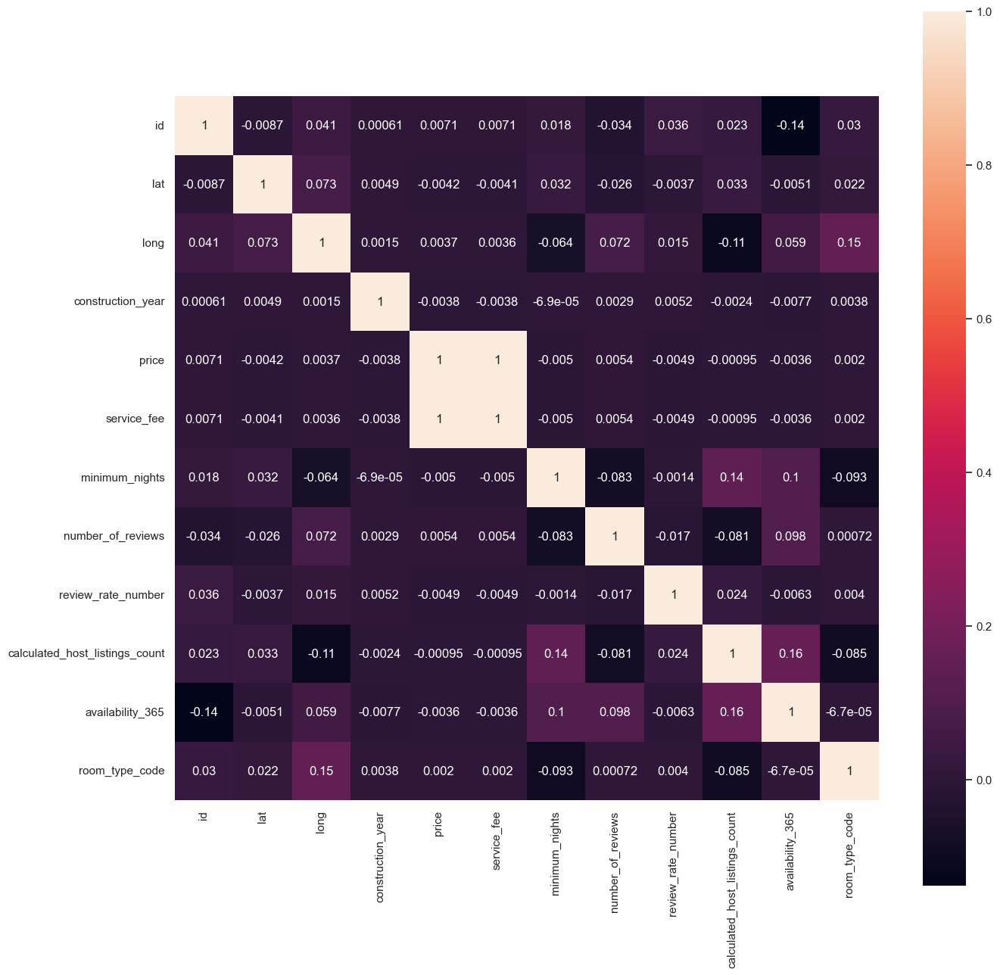

In [148]:
# heatmap of correlation
sns.set(rc={"figure.figsize":(15, 15)})
sns.heatmap(df.corr(), annot=True, square=True)

Multivariate yang paling tinggi adalah price dan service fee, sisanya nggak ada yang di atas 0.8. Maka drop kolom service fee

In [149]:
df.drop(columns=['service_fee'], inplace=True)

C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\3158987996.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, square=True)


<AxesSubplot:>

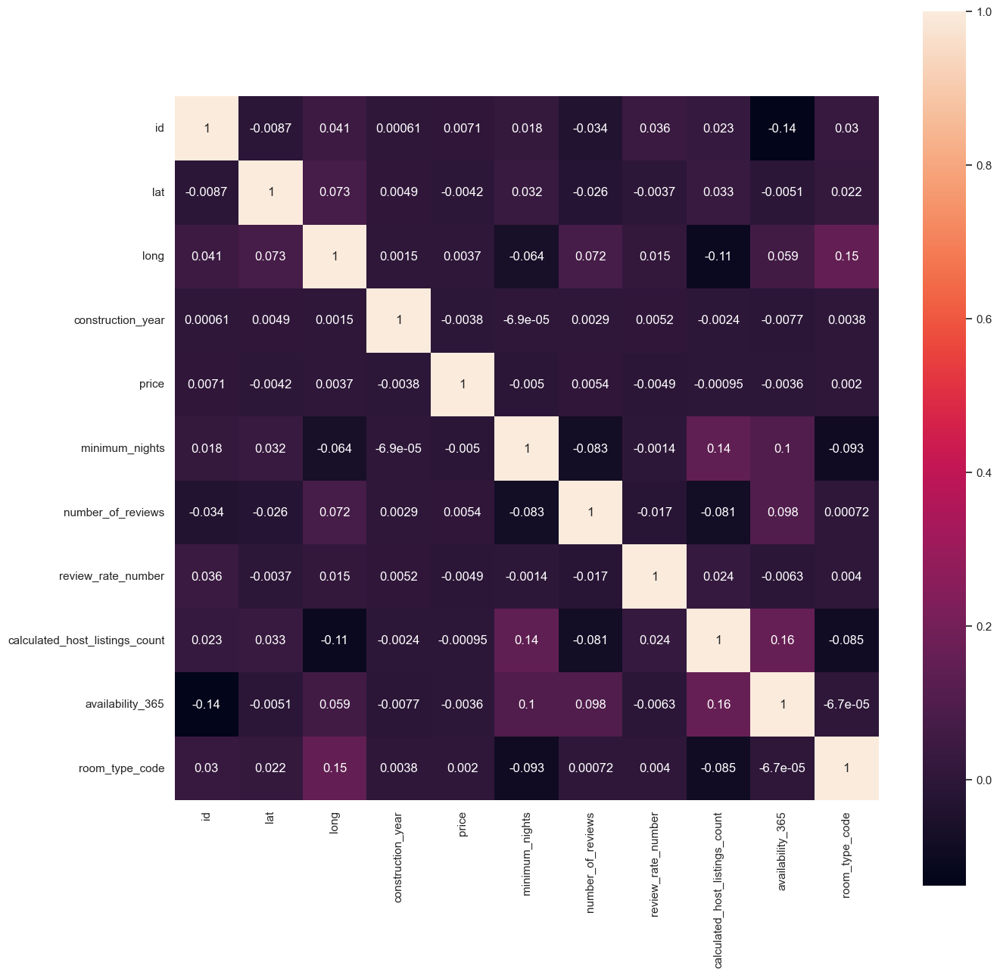

In [150]:
# heatmap of correlation yang baru
sns.set(rc={"figure.figsize":(15, 15)})
sns.heatmap(df.corr(), annot=True, square=True)

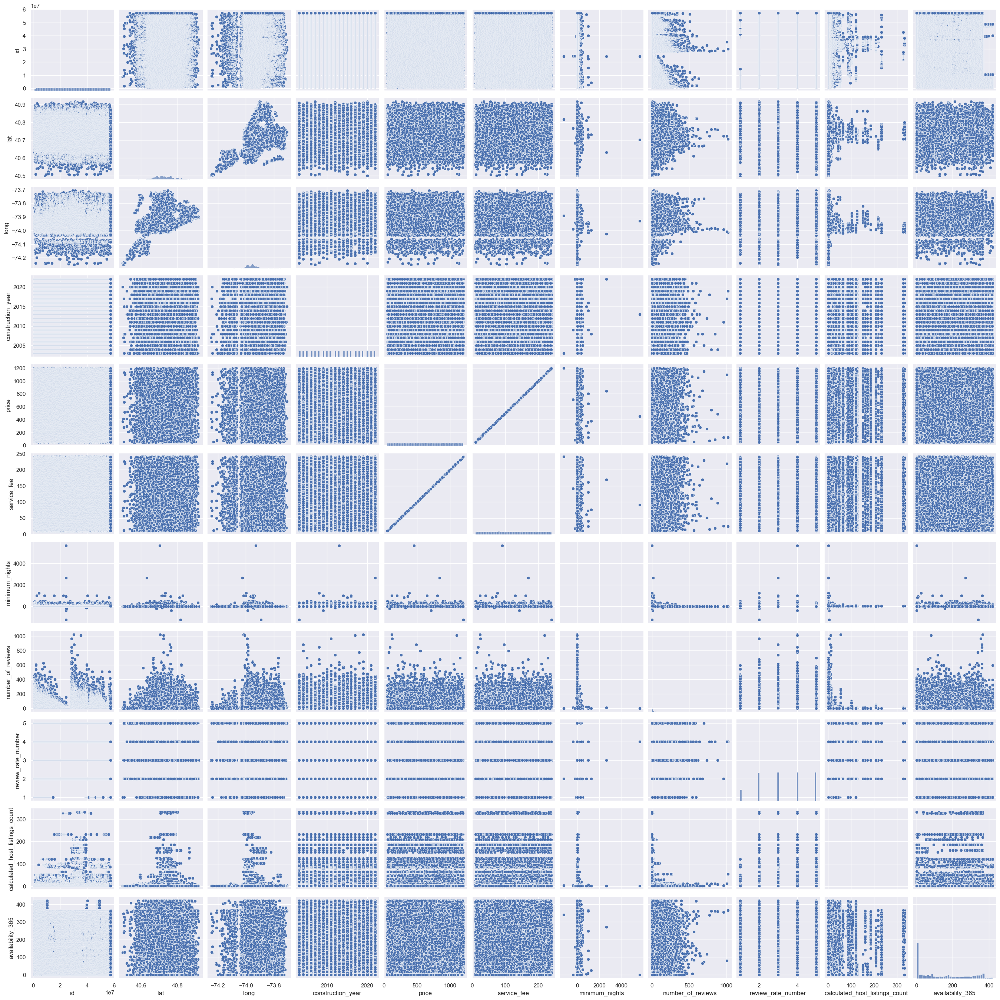

In [151]:
sb.pairplot(numeric_columns)

# **Machine Learning**

THE Pricing a rental property on Airbnb is a difﬁculttask for the owner because the number of customerson the premises is determined. On the other hand, customersmust assess the offered price with minimal knowledge of theproperty’s optimum value. In order to help the landlord andconsumers with price estimation, this paper seeks to builda robust pricing model utilizing computer intelligence, deeplearning and natural language processing techniques, despitethe minimum accessible description of the house.

What is Airbnb ?
Airbnb began in 2008 when two designers who had space to share hosted three travelers looking for a place to stay. Now, millions of hosts and travelers choose to create a free Airbnb account so they can list their space and book unique accommodations anywhere in the world. And Airbnb experience hosts share their passions and interests with both travelers and locals.

intinya ini tuh bantu karena pemilik juga takutnya salah kan, konsumen juga bingung. jadi dari fitur2nya tuh bakal dilakuin prediksi harga buat ownernya

nanti segmentasinya 2 aja (kalo sempet oawkokwo):
1. segmentasi konsumen
2. segmentasi si penginapannya

## 1. One Hot Encoding

In [152]:
df.drop(columns=['outlier_mn'], inplace=True)

In [153]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100052 entries, 0 to 102044
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              100052 non-null  int64  
 1   name                            100052 non-null  object 
 2   host_identity_verified          100052 non-null  object 
 3   host_name                       100052 non-null  object 
 4   neighbourhood_group             100052 non-null  object 
 5   neighbourhood                   100052 non-null  object 
 6   lat                             100052 non-null  float64
 7   long                            100052 non-null  float64
 8   instant_bookable                100052 non-null  object 
 9   cancellation_policy             100052 non-null  object 
 10  room_type                       100052 non-null  object 
 11  construction_year               100052 non-null  int32  
 12  price           

Yang masih objek mari kita one hot encoding

In [154]:
from sklearn.preprocessing import LabelEncoder

**Host Identity Verified**

In [155]:
df['host_identity_verified'].value_counts()

unconfirmed    50072
verified       49980
Name: host_identity_verified, dtype: int64

In [156]:
le = LabelEncoder()
host_identity_verified_le = LabelEncoder()
df['host_identity_verified'] = host_identity_verified_le.fit_transform(df['host_identity_verified'])

df['host_identity_verified'].value_counts()
# unconfirmed --> 0 , verified --> 1

0    50072
1    49980
Name: host_identity_verified, dtype: int64

**Neighbourhood Group**

In [157]:
df['neighbourhood_group'].value_counts()

Manhattan        42721
Brooklyn         40803
Queens           12965
Bronx             2631
Staten Island      932
Name: neighbourhood_group, dtype: int64

In [158]:
le = LabelEncoder()
neighbourhood_group_le = LabelEncoder()
df['neighbourhood_group'] = neighbourhood_group_le.fit_transform(df['neighbourhood_group'])
df['neighbourhood_group'].value_counts()
# Brooklyn --> 1 , Manhattan --> 2 , Bronx --> 0 , Queens --> 3 , Staten Island --> 4 

2    42721
1    40803
3    12965
0     2631
4      932
Name: neighbourhood_group, dtype: int64

**Instnat Bookable**

In [159]:
df['instant_bookable'].value_counts()

False    50261
True     49791
Name: instant_bookable, dtype: int64

In [160]:
le = LabelEncoder()
instant_bookable_le = LabelEncoder()
df['instant_bookable'] = instant_bookable_le.fit_transform(df['instant_bookable'])
df['instant_bookable'].value_counts()
# False --> 0 , True --> 1 

0    50261
1    49791
Name: instant_bookable, dtype: int64

**Cancellation Policy**

In [161]:
df['cancellation_policy'].value_counts()

moderate    33529
strict      33313
flexible    33210
Name: cancellation_policy, dtype: int64

In [162]:
le = LabelEncoder()
cancellation_policy_le = LabelEncoder()
df['cancellation_policy'] = cancellation_policy_le.fit_transform(df['cancellation_policy'])
df['cancellation_policy'].value_counts()
# moderate --> 1 , strict --> 2 , flexible --> 0

1    33529
2    33313
0    33210
Name: cancellation_policy, dtype: int64

**Room Type**

In [163]:
df['room_type'].value_counts()

Entire home/apt    52411
Private room       45371
Shared room         2157
Hotel room           113
Name: room_type, dtype: int64

In [164]:
le = LabelEncoder()
room_type_le = LabelEncoder()
df['room_type'] = room_type_le.fit_transform(df['room_type'])
df['room_type'].value_counts()
# Hotel room --> 1 , Private room --> 2 , Entire home/apt --> 0 , Shared room --> 3

0    52411
2    45371
3     2157
1      113
Name: room_type, dtype: int64

Maka sekarang data yang diperlukan sudah menjadi integer semua

In [165]:
df_new = df.iloc[:, 1:].select_dtypes(exclude=['object'])
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100052 entries, 0 to 102044
Data columns (total 15 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   host_identity_verified          100052 non-null  int32  
 1   neighbourhood_group             100052 non-null  int32  
 2   lat                             100052 non-null  float64
 3   long                            100052 non-null  float64
 4   instant_bookable                100052 non-null  int32  
 5   cancellation_policy             100052 non-null  int32  
 6   room_type                       100052 non-null  int32  
 7   construction_year               100052 non-null  int32  
 8   price                           100052 non-null  float64
 9   minimum_nights                  100052 non-null  int16  
 10  number_of_reviews               100052 non-null  int16  
 11  review_rate_number              100052 non-null  float64
 12  calculated_host_

## 2. Splitting Data

In [166]:
df_new.describe().round(3)

# Sejauh ini datanya udah oke, tetapi cukup beragam. Jadi akan dilakukan standar Scaling terlebih dahulu

,host_identity_verified,neighbourhood_group,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,minimum_nights,number_of_reviews,review_rate_number,calculated_host_listings_count,availability_365,room_type_code
count,100052.0,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000,100052.000
mean,0.5,1.688,40.728,-73.950,0.498,1.001,0.973,2012.488,625.336,7.909,27.289,3.279,7.964,140.866,0.500
std,0.5,0.763,0.056,0.050,0.500,0.815,1.031,5.764,331.697,18.025,49.174,1.285,32.378,134.860,0.548
min,0.0,0.000,40.500,-74.250,0.000,0.000,0.000,2003.000,50.000,0.000,0.000,1.000,1.000,0.000,0.000
25%,0.0,1.000,40.689,-73.983,0.000,0.000,0.000,2007.000,340.000,1.000,1.000,2.000,1.000,3.000,0.000
50%,0.0,2.000,40.722,-73.954,0.000,1.000,0.000,2012.000,625.000,3.000,7.000,3.000,1.000,96.000,0.000
75%,1.0,2.000,40.763,-73.932,1.000,2.000,2.000,2017.000,913.000,5.000,30.000,4.000,2.000,268.000,1.000
max,1.0,4.000,40.917,-73.705,1.000,2.000,3.000,2022.000,1200.000,365.000,1024.000,5.000,332.000,420.000,3.000


In [167]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [168]:
x = df_new.drop(["price"],axis=1).values
y = df_new['price'].values

In [169]:
X_train,X_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=42)
# 80% Training 20 Tesst

In [170]:
# Dilakukan standar scaler agar penyimpangan datanya tidak terlalu jauh

ss_scaler = StandardScaler()
X_train = ss_scaler.fit_transform(X_train)
X_test = ss_scaler.fit_transform(X_test)

## 3. Modelling Price Prediction

In [171]:
from xgboost import XGBClassifier
from xgboost import XGBRegressor

from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, recall_score, precision_score
from sklearn.metrics import confusion_matrix, roc_auc_score, f1_score, recall_score
from sklearn.metrics import mean_squared_error

In [172]:
cly = [LinearRegression(),
       Ridge(random_state=42),
       Lasso(max_iter=10, random_state=42),
       RandomForestRegressor(),
       XGBRegressor(),
       GradientBoostingRegressor(),
       SVR(),
       ElasticNet(),
       HuberRegressor(),
       KNeighborsRegressor(),
       MLPRegressor(max_iter=10)]  # You can configure MLPRegressor as needed

In [173]:
results_df = pd.DataFrame(columns=['Method', 'RMSE TRAIN', 'RMSE TEST'])

for model in cly:
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    preds_t = model.predict(X_train)
    
    method = str(type(model)).split('.')[-1][:-2]
    
    # Calculate RMSE
    rmse_train = mean_squared_error(y_train, preds_t, squared=False)
    rmse_test = mean_squared_error(y_test, preds, squared=False)
    
    # Calculate MSE
    mse_train = mean_squared_error(y_train, preds_t)
    mse_test = mean_squared_error(y_test, preds)
    
    # Calculate R-squared
    r2_train = r2_score(y_train, preds_t)
    r2_test = r2_score(y_test, preds)
    
    # Append results to the dataframe
    results_df = results_df.append({'Method': method, 
                                    'RMSE TRAIN' : rmse_train,
                                    'RMSE TEST': rmse_test,
                                    'MSE TRAIN': mse_train,
                                    'MSE TEST': mse_test,
                                    'R-squared TRAIN': r2_train,
                                    'R-squared TEST': r2_test},
                                    ignore_index=True)
    results_df

C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Method': method,
C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Method': method,
C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Method': method,


C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Method': method,
C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Method': method,
C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Method': method,
C:\Users\Zenbook\AppData\Local\Temp\ipykernel_28512\2632127296.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append

In [182]:
results_df

,Method,RMSE TRAIN,RMSE TEST,MSE TRAIN,MSE TEST,R-squared TRAIN,R-squared TEST
0,LinearRegression,331.814469,331.106518,110100.841726,109631.526168,0.000241,-0.000305
1,Ridge,331.814469,331.106511,110100.841727,109631.521735,0.000241,-0.000304
2,Lasso,331.834482,331.076104,110114.123264,109611.386418,0.000120,-0.000121
3,RandomForestRegressor,102.909034,289.587663,10590.269330,83861.014319,0.903836,0.234832
4,XGBRegressor,300.064577,329.904021,90038.750507,108836.663111,0.182412,0.006948
5,GradientBoostingRegressor,330.090169,331.011904,108959.519913,109568.880648,0.010604,0.000267
6,SVR,331.556590,331.121775,109929.772147,109641.630144,0.001794,-0.000397
7,ElasticNet,331.830535,331.076462,110111.503730,109611.623461,0.000144,-0.000123
8,HuberRegressor,331.817997,331.127453,110103.183430,109645.389802,0.000219,-0.000431
9,KNeighborsRegressor,293.465096,359.697814,86121.762393,129382.517146,0.217980,-0.180517


In [174]:
for model in cly:
    model.fit(X_train, y_train)  # Train the model
    method = str(type(model)).split('.')[-1][:-2]
    
    # Make predictions on the test data
    y_pred = model.predict(X_test)
    
    # Create a DataFrame to show actual and predicted values
    df = pd.DataFrame({"Y_test": y_test, "Y_pred": y_pred})
    
    # Display the first 10 rows of the DataFrame
    print(f"Method: {method}")
    print(df.head(10))
    print()

Method: LinearRegression
   Y_test      Y_pred
0   648.0  623.875421
1   798.0  626.069705
2   355.0  623.540852
3  1086.0  633.862838
4  1160.0  634.403175
5  1154.0  624.037196
6   630.0  622.087836
7   296.0  630.904584
8  1170.0  627.710773
9   596.0  619.175059

Method: Ridge
   Y_test      Y_pred
0   648.0  623.875934
1   798.0  626.070129
2   355.0  623.540615
3  1086.0  633.863136
4  1160.0  634.403502
5  1154.0  624.037649
6   630.0  622.087726
7   296.0  630.905051
8  1170.0  627.710495
9   596.0  619.175641

Method: Lasso
   Y_test      Y_pred
0   648.0  625.992823
1   798.0  625.504260
2   355.0  625.264601
3  1086.0  629.507029
4  1160.0  628.740807
5  1154.0  625.561961
6   630.0  623.742157
7   296.0  628.141686
8  1170.0  625.496000
9   596.0  625.455989

Method: RandomForestRegressor
   Y_test  Y_pred
0   648.0  531.31
1   798.0  748.06
2   355.0  622.69
3  1086.0  751.29
4  1160.0  829.59
5  1154.0  779.59
6   630.0  664.82
7   296.0  456.48
8  1170.0  601.55
9   596.

c:\Users\Zenbook\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


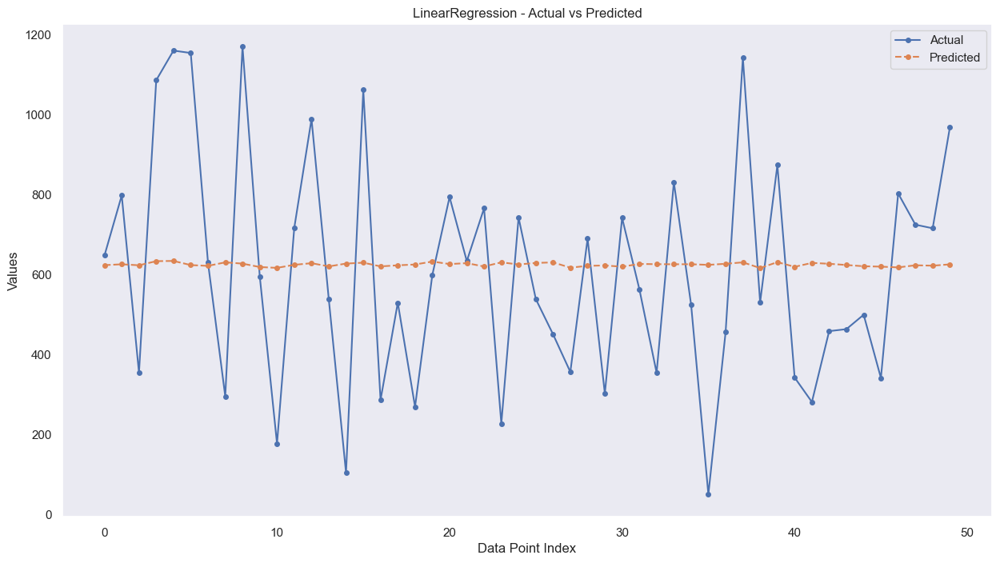

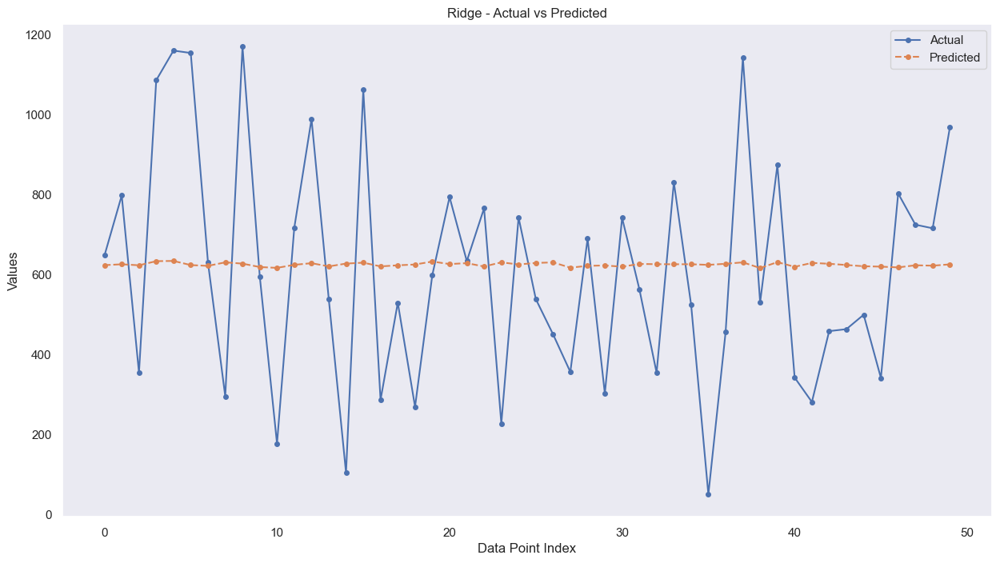

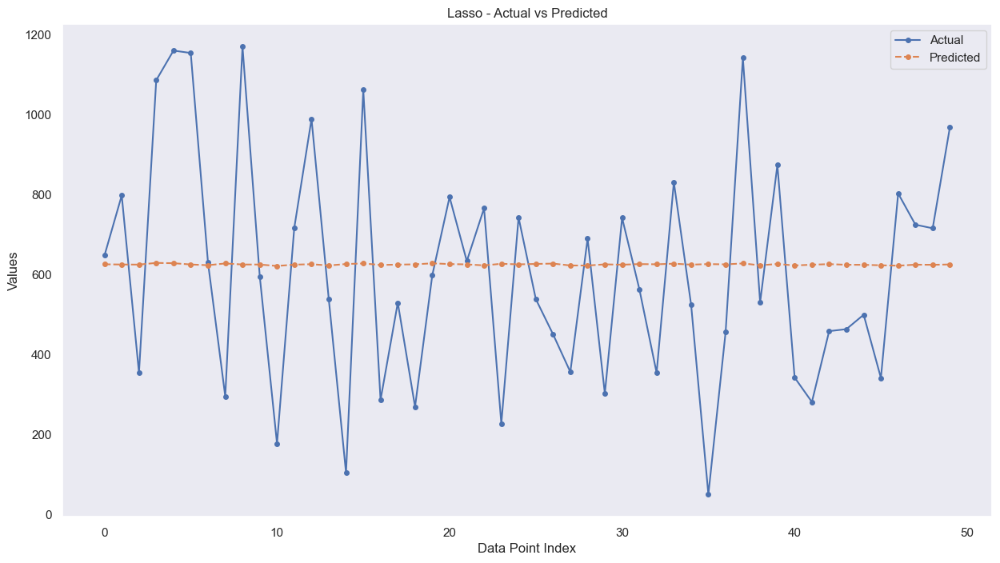

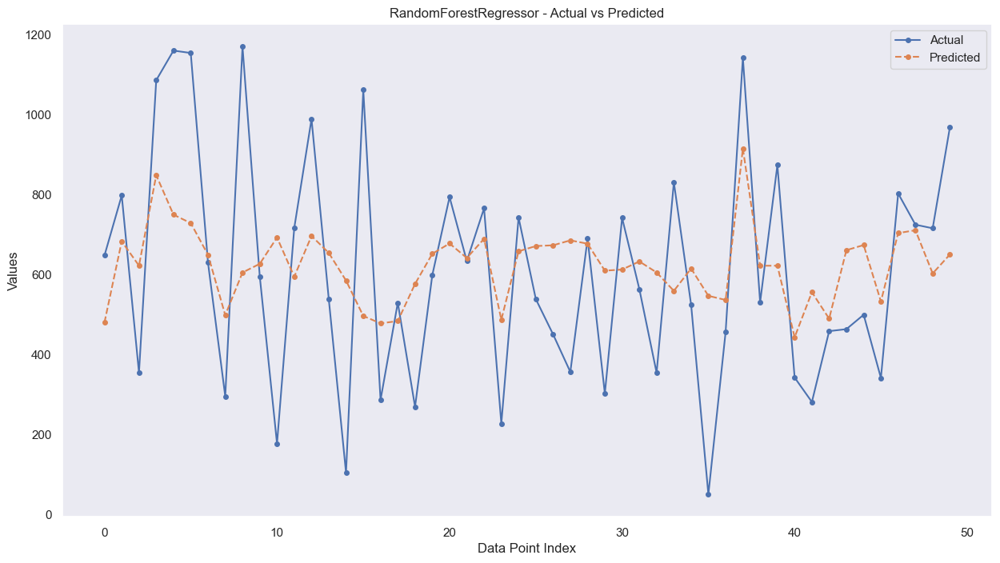

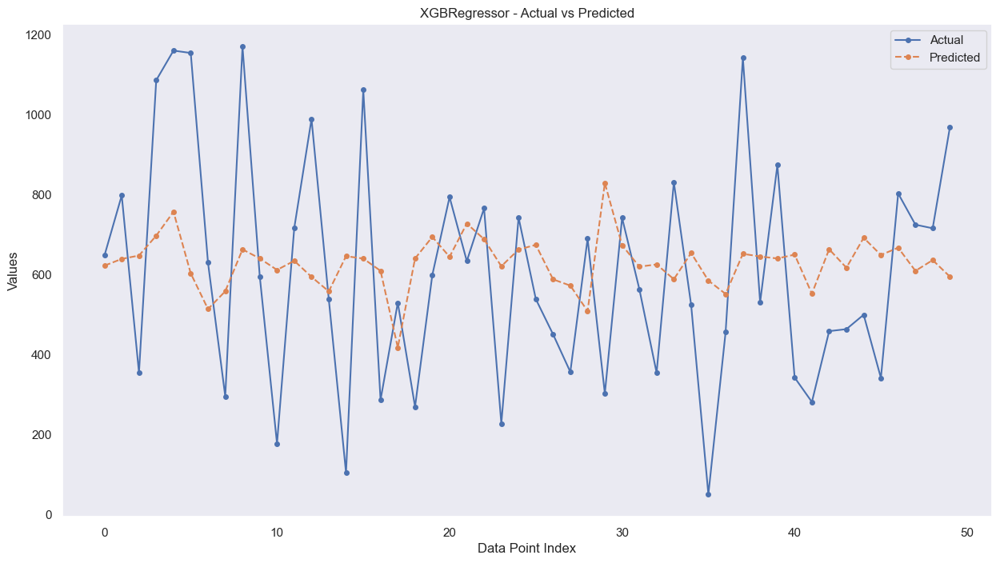

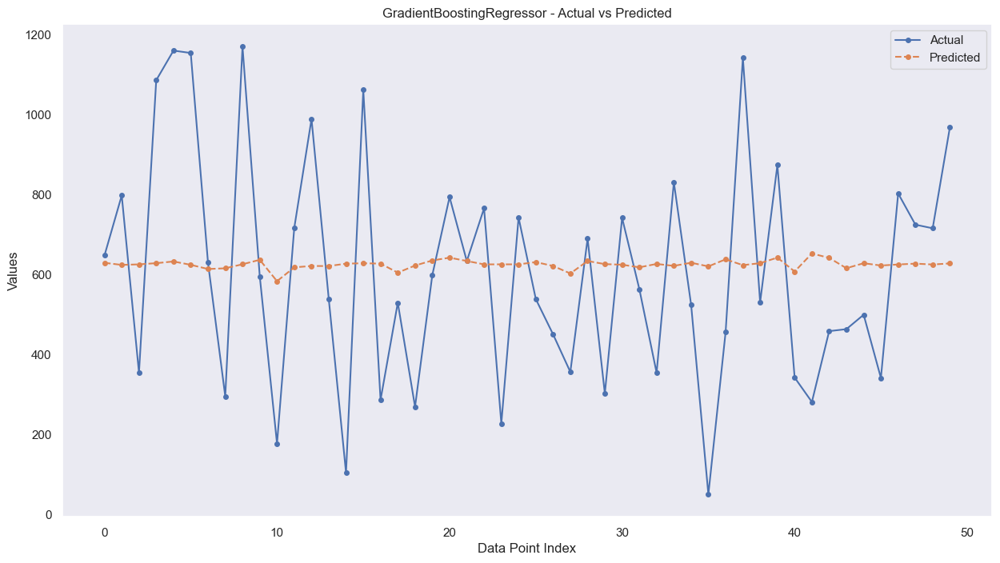

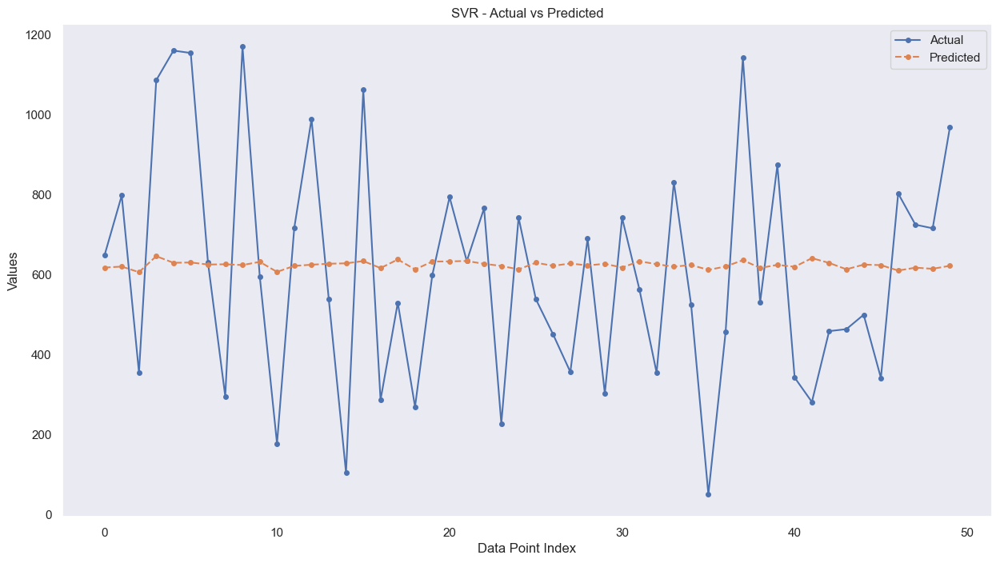

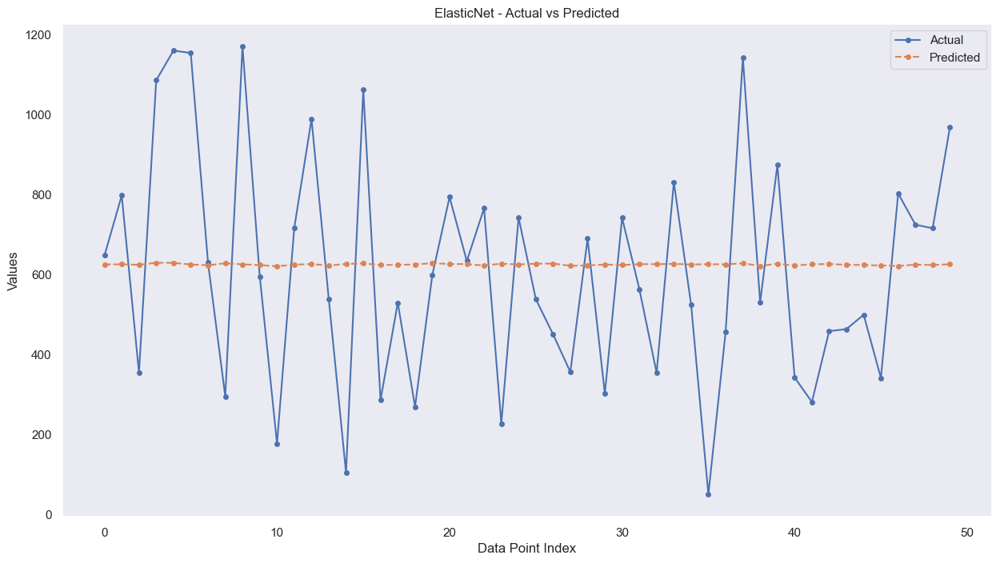

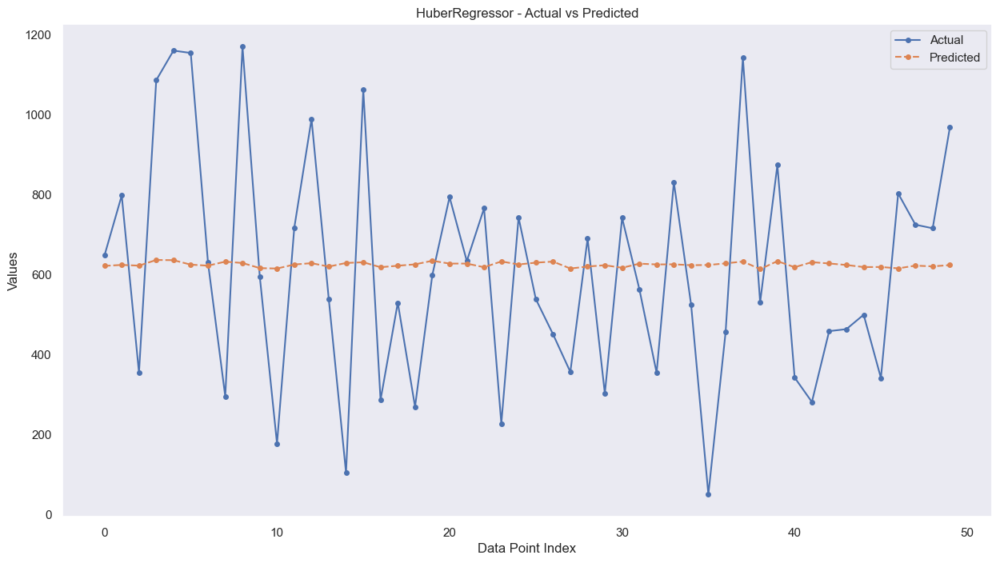

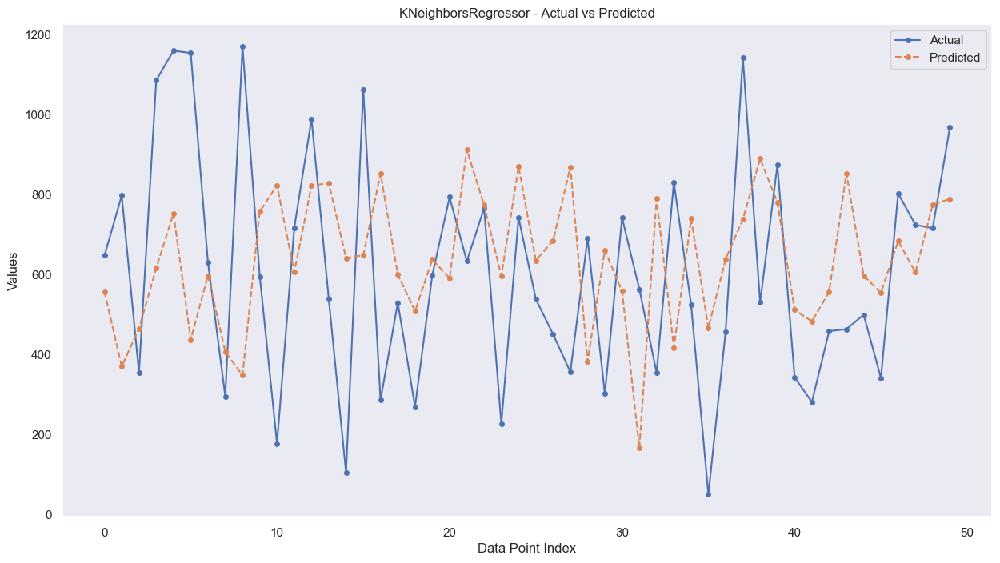

c:\Users\Zenbook\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


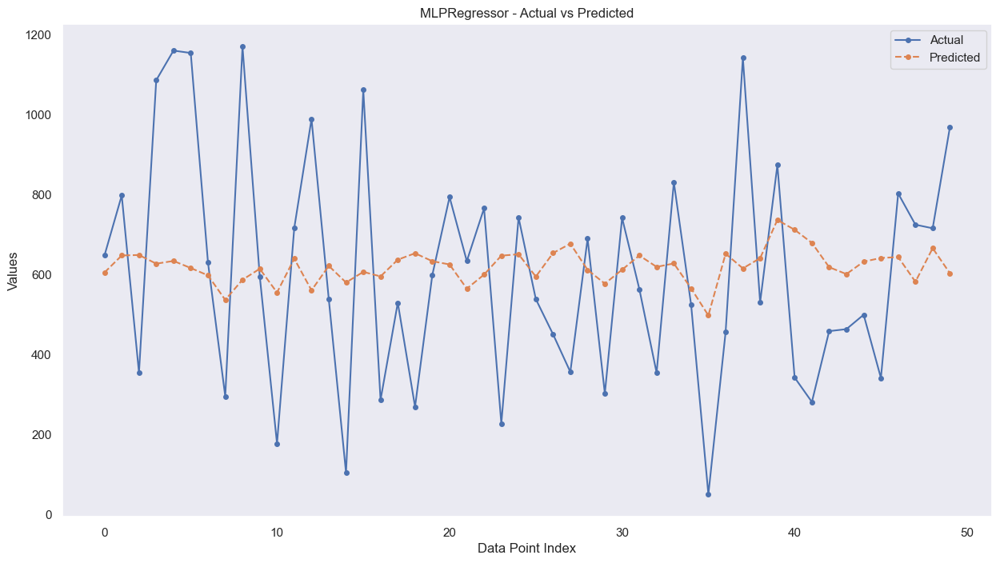

In [175]:
def plot_predictions_limited(model, x_data, y_data, title, num_points=50):
    preds = model.predict(x_data)
    n = len(y_data)  # Number of data points
    x_indices = np.arange(min(n, num_points))  # Limit the number of data points to be shown

    plt.figure(figsize=(15, 8))
    plt.plot(x_indices, y_data[:num_points], label="Actual", linestyle='-', marker='o', markersize=4)
    plt.plot(x_indices, preds[:num_points], label="Predicted", linestyle='--', marker='o', markersize=4)

    plt.xlabel("Data Point Index")
    plt.ylabel("Values")
    plt.title(title)
    plt.legend()
    plt.grid()
    plt.show()

# Loop through each model and plot limited predictions
for model in cly:
    model.fit(X_train, y_train)
    method = str(type(model)).split('.')[-1][:-2]
    title = f"{method} - Actual vs Predicted"
    plot_predictions_limited(model, X_test, y_test, title, num_points=50)

In [178]:
df_FI = pd.DataFrame(X_train)

Model does not have feature importances
Model does not have feature importances
Model does not have feature importances


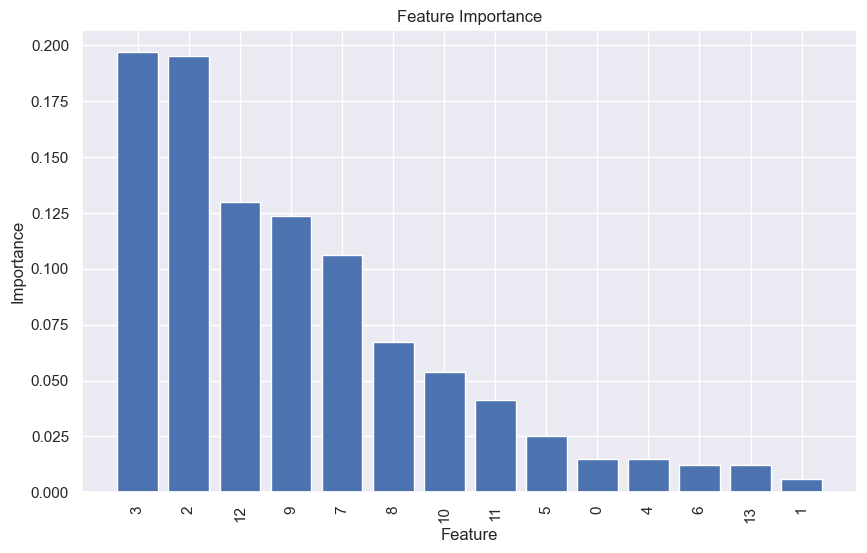

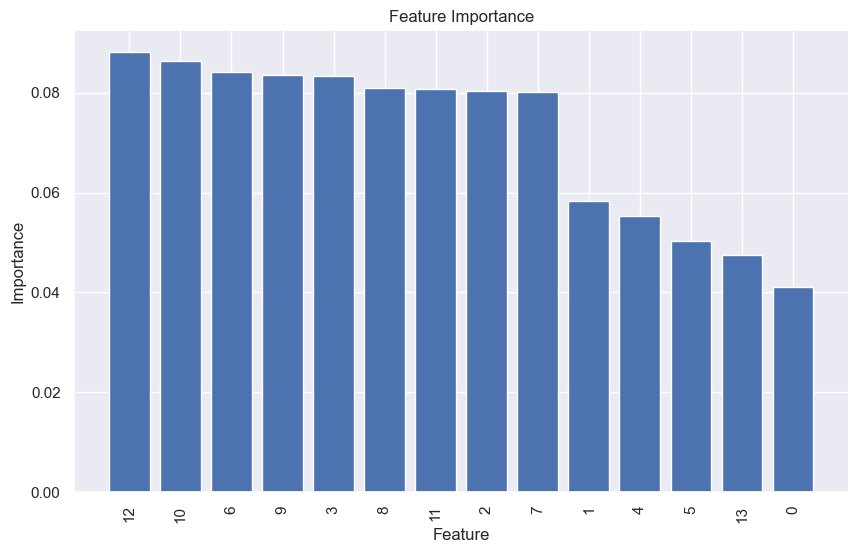

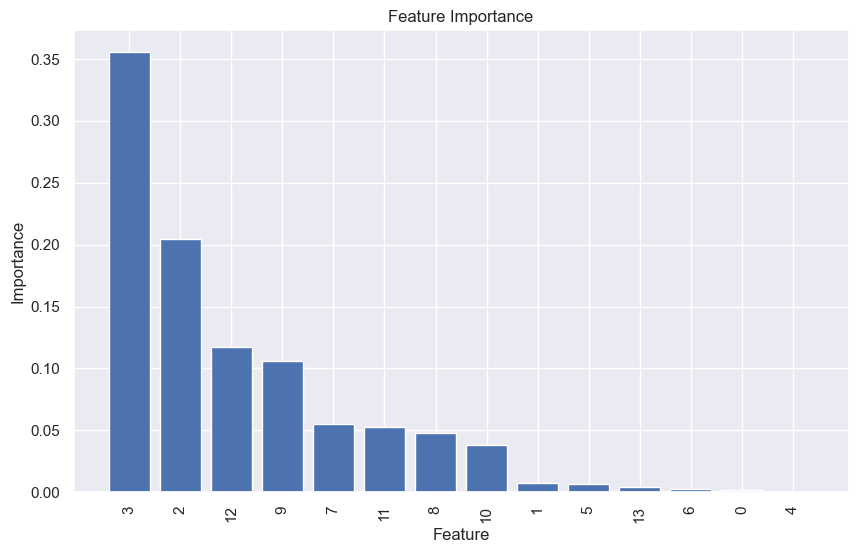

Model does not have feature importances
Model does not have feature importances
Model does not have feature importances
Model does not have feature importances
Model does not have feature importances


c:\Users\Zenbook\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


In [179]:
import matplotlib.pyplot as plt

def plot_feature_importance(model, feature_names):
    """
    Plots the feature importance of a given model.

    Parameters:
        model (object): The trained machine learning model.
        feature_names (list): List of feature names used for training the model.
    """
    if hasattr(model, 'feature_importances_'):
        # For models with feature_importances_ attribute (e.g., RandomForest, XGBoost)
        importance = model.feature_importances_
        feature_importance = list(zip(feature_names, importance))
        feature_importance.sort(key=lambda x: x[1], reverse=True)

        # Plot feature importance
        plt.figure(figsize=(10, 6))
        plt.bar(range(len(feature_importance)), [imp for (_, imp) in feature_importance], align='center')
        plt.xticks(range(len(feature_importance)), [feat for (feat, _) in feature_importance], rotation=90)
        plt.xlabel('Feature')
        plt.ylabel('Importance')
        plt.title('Feature Importance')
        plt.show()
    else:
        print("Model does not have feature importances")

# Contoh penggunaan fungsi
for model in cly:
    model.fit(X_train, y_train)  # Train the model
    method = str(type(model)).split('.')[-1][:-2]
    
    # Plot feature importance (jika model mendukungnya)
    plot_feature_importance(model, feature_names= df_FI.columns )